In [1]:
import pickle
import boris_extraction as boris
import multirecording_spikeanalysis as spike
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from scipy.stats import sem
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel
import matplotlib.patches as mpatches
from itertools import combinations
from collections import defaultdict

def hex_2_rgb(hex_color): # Orange color
    rgb_color = tuple(int(hex_color[i:i+2], 16) / 255.0 for i in (1, 3, 5))
    return rgb_color

def pickle_this(thing_to_pickle, file_name):
    """
    Pickles things
    Args (2):   
        thing_to_pickle: anything you want to pickle
        file_name: str, filename that ends with .pkl 
    Returns:
        none
    """
    with open(file_name,'wb') as file:
        pickle.dump(thing_to_pickle, file)

def unpickle_this(pickle_file):
    """
    Unpickles things
    Args (1):   
        file_name: str, pickle filename that already exists and ends with .pkl
    Returns:
        pickled item
    """
    with open(pickle_file, 'rb') as file:
        return(pickle.load(file))


In [2]:
phase2_collection = unpickle_this('phase2collection.pkl')

phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection, timebin = 100,ignore_freq =  0.5)

All set to analyze


### AUC PLOTTING FUNCTIONS

In [ ]:
glm = {}
glm_shuffle = {}
rf = {}
rf_shuffle = {}
for key in auc.keys():
    glm[key] = auc[key]['glm']
    rf[key] = auc[key]['rf']
    glm_shuffle_temp = []
    rf_shuffle_temp = []
    for i in range(5):
        glm_shuffle_temp.append(auc[key]['glm_shuffle'][i])
        rf_shuffle_temp.append(auc[key]['rf_shuffle'][i])
    glm_shuffle[key] = np.array(glm_shuffle_temp).reshape(25,100)
    rf_shuffle[key] = np.array(rf_shuffle_temp).reshape(25,100)
model_dict = {'Generalized Linear Model':glm, 'Random Forest Classifier':rf,
              'Generalized Linear Model\nSHUFFLED':glm_shuffle, 
              'Random Forest Classifier\nSHUFFLED':rf_shuffle}


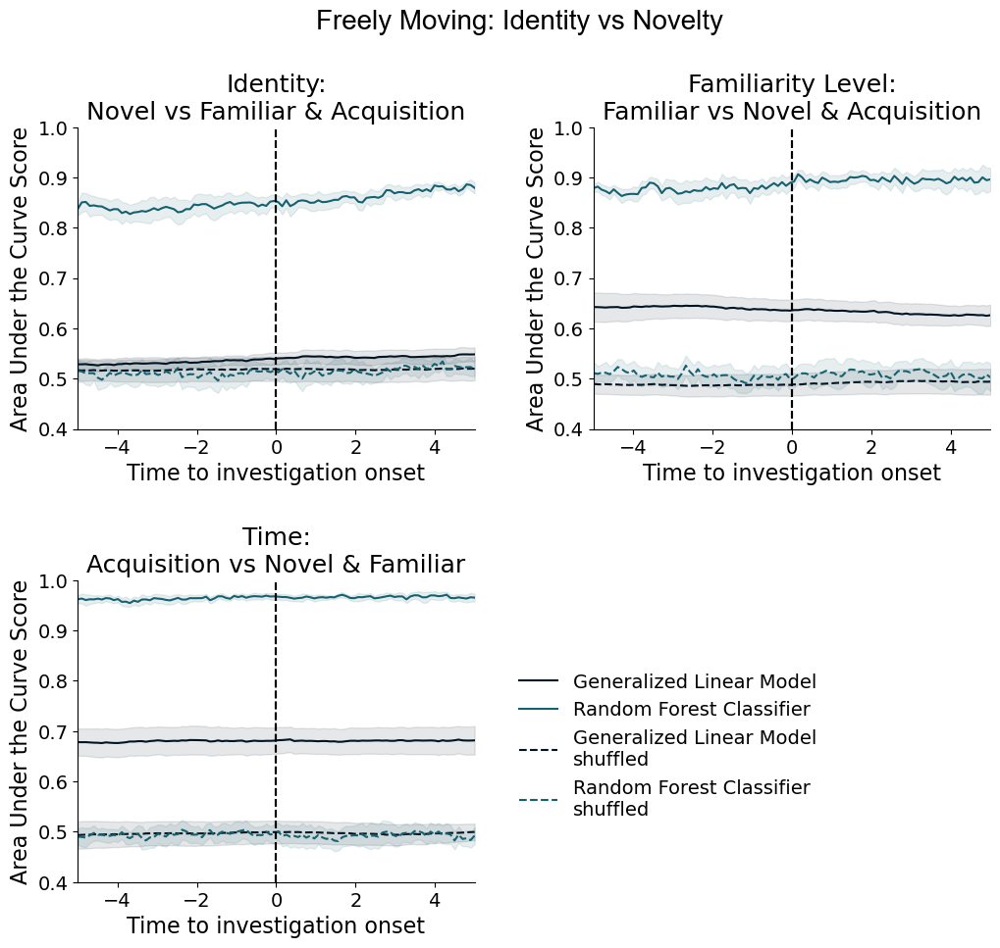

In [ ]:
avg_auc = {}
no_plots = len(identity_auc.keys())
height_fig = math.ceil(no_plots/2)
i = 1
plt.figure(figsize=(12,10))
for key in identity_auc.keys():
    glm_avg = np.mean(identity_auc[key]['glm'], axis = 0)
    glm_sem = sem(identity_auc[key]['glm'], axis = 0)
    x =np.linspace(-pre_window, equalize, len(glm_avg))
    rf_avg = np.mean(identity_auc[key]['rf'], axis = 0)
    rf_sem = sem(identity_auc[key]['rf'], axis = 0)
    glm_shuffle_avg = np.mean(np.mean(identity_auc[key]['glm_shuffle'], axis = 1), axis = 0)
    glm_shuffle_sem = sem(np.mean(identity_auc[key]['glm_shuffle'], axis = 1), axis = 0)
    rf_shuffle_avg = np.mean(np.mean(identity_auc[key]['rf_shuffle'], axis = 1), axis = 0)
    rf_shuffle_sem = sem(np.mean(identity_auc[key]['rf_shuffle'], axis = 1), axis = 0)
    avg_auc[key] = [glm_avg, rf_avg, glm_shuffle_avg, rf_shuffle_avg]
    plt.subplot(2,2,i)
    plt.plot(x, glm_avg, label ='Generalized Linear Model', color = hex_2_rgb('#001424'))
    plt.fill_between(x, glm_avg-glm_sem, glm_avg+glm_sem, color = hex_2_rgb('#001424'), alpha = 0.1)
    plt.plot(x, rf_avg, label =  'Random Forest Classifier', color = hex_2_rgb('#15616F'))
    plt.fill_between(x, rf_avg-rf_sem, rf_avg+rf_sem, alpha = 0.1, color = hex_2_rgb('#15616F'))
    plt.plot(x, glm_shuffle_avg, linestyle='--', color = hex_2_rgb('#001424'), label = 'Generalized Linear Model\nshuffled')
    plt.fill_between(x, glm_shuffle_avg-glm_shuffle_sem, glm_shuffle_avg+glm_shuffle_sem, color = hex_2_rgb('#001424'), alpha = 0.1)
    plt.plot(x, rf_shuffle_avg, linestyle='--', label = 'Random Forest Classifier\nshuffled', color = hex_2_rgb('#15616F'))
    plt.fill_between(x, rf_shuffle_avg-rf_shuffle_sem, rf_shuffle_avg+rf_shuffle_sem, alpha = 0.1, color = hex_2_rgb('#15616F'))
    if key == 'recall':
        plt.title('Familiarity Level:\nFamiliar vs Novel & Acquisition', fontsize = 18)
    if key == 'novel':
        plt.title('Identity:\nNovel vs Familiar & Acquisition', fontsize = 18)
    if key == 'acquisition':
        plt.title('Time:\nAcquisition vs Novel & Familiar', fontsize = 18)
    plt.ylim(.4, 1)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.xlim(-5,5)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('Time to investigation onset', fontsize=16)
    plt.ylabel('Area Under the Curve Score', fontsize=16)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if i ==3:
        plt.legend(bbox_to_anchor = (1.07,.75), frameon=False, fontsize = 14)
    i += 1
plt.suptitle('Freely Moving: Identity vs Novelty', fontsize = 20, font = 'Arial', y = 1)
plt.subplots_adjust(hspace = 0.5, wspace=0.3)
plt.show()

## Decoders

In [26]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection, timebin = 100, ignore_freq=0.5)

All set to analyze


### Functions

In [12]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
                                   
def __PCA_for_decoding_minus_pc1__(equalize, pre_window, post_window, no_PCs, events, counter_event=None):
        full_PCA_matrix, t_df, key, coefficients, explained_variance_ratios = phase2_analysis.PCA_matrix_generation(equalize, pre_window, post_window, events = None)
        recordings = full_PCA_matrix.columns.to_list()
        recording_list = np.unique(recordings)
        coefficients = coefficients[:, 1:no_PCs]
        recording_indices = get_indices(recordings)
        decoder_data1 = {}
        all_events = events
        if counter_event is not None:
            for event in counter_event:
                if event not in all_events:
                    all_events.append(event)
        #decoder data dict: events for keys, values is a list of len(events)
        #each element in the list is the transformed matrix
        for recording in recording_list:
            #iterate through recordings
            start = recording_indices[recording][0]
            stop = recording_indices[recording][1]
            #trim weight matrix for only those neurons in the current recording
            subset_coeff = coefficients[start:stop+1, :]
            recording_instance = phase2_analysis.ephyscollection.get_by_name(recording)
            for event in all_events:
                #grab all event firing rates for current event in current recording
                event_firing_rates = phase2_analysis.__get_event_firing_rates__(recording_instance, event,
                                                                equalize, pre_window, post_window)
                for trial in range(len(event_firing_rates)):
                    #iterate through each event
                    trial_data = np.transpose(event_firing_rates[trial])
                    #transpoe event firing rates from neurons x timebins to timebins x neurons
                    transformed_trial = np.dot(trial_data, subset_coeff)
                    #transform each trial with original weight matrix
                    #T (timebins x pcs) = D (timebins x neurons). W (pcs x neurons) 
                    if event in decoder_data1.keys():
                        #append transformed matrix to decoder_data1 dict
                        decoder_data1[event].append(transformed_trial)
                    else: 
                        decoder_data1[event] = []
                        decoder_data1[event].append(transformed_trial)
        return decoder_data1


def get_indices(repeated_items_list):
    """
    Takes in an indexed key or a list of repeated items, 
    creates a list of indices that correspond to each unique item.

    Args (1):
        repeated_items_list: list, list of repeated items

    Returns:
        item_indices: list of tuples, where the first element
            is the first index of an item, and the second
            element is the last index of that item
    """
    is_first = True
    item_indices = {}
    for i in range(len(repeated_items_list)):
        if is_first:
            current_item = repeated_items_list[i]
            start_index = 0
            is_first = False
        else:
            if repeated_items_list[i] == current_item:
                end_index = i
                if i == (len(repeated_items_list)-1):
                    item_indices[current_item] = [start_index, end_index]
            else:
                item_indices[current_item] = [start_index, end_index]
                start_index = i
                current_item = repeated_items_list[i]
    return item_indices

def __PCA_for_decoding__(equalize, pre_window, post_window, no_PCs, events, counter_events = None):
        full_PCA_matrix, t_df, key, coefficients, explained_variance_ratios = phase2_analysis.PCA_matrix_generation(equalize, pre_window, post_window, events = events)
        recordings = full_PCA_matrix.columns.to_list()
        recording_list = np.unique(recordings)
        coefficients = coefficients[:, :no_PCs]
        recording_indices = get_indices(recordings)
        decoder_data = {}
        if counter_events is not None:
            for event in counter_events:
                if event not in events:
                    events.append(event)
        #decoder data dict: events for keys, values is a list of len(events)
        #each element in the list is the transformed matrix
        for recording in recording_list:
            #iterate through recording
            start = recording_indices[recording][0]
            stop = recording_indices[recording][1]
            #trim weight matrix for only those neurons in the current recording
            subset_coeff = coefficients[start:stop+1, :]
            recording_instance = phase2_analysis.ephyscollection.get_by_name(recording)
            for event in events:
                #grab all event firing rates for current event in current recording
                event_firing_rates = phase2_analysis.__get_event_firing_rates__(recording_instance, event,
                                                                equalize, pre_window, post_window)
                for trial in range(len(event_firing_rates)):
                    #iterate through each event
                    trial_data = np.transpose(event_firing_rates[trial])
                    #transpoe event firing rates from neurons x timebins to timebins x neurons
                    transformed_trial = np.dot(trial_data, subset_coeff)
                    #transform each trial with original weight matrix
                    #T (timebins x pcs) = D (timebins x neurons). W (pcs x neurons) 
                    if event in decoder_data.keys():
                        #append transformed matrix to decoder_data1 dict
                        decoder_data[event].append(transformed_trial)
                    else: 
                        decoder_data[event] = []
                        decoder_data[event].append(transformed_trial)
        return decoder_data



def cross_trial_decoder(equalize, pre_window, post_window, num_fold, num_shuffle, no_PCs, same_event, event1, event2, plot = True):
    decoder_data1 = __PCA_for_decoding__(equalize, pre_window, post_window, no_PCs, events = [same_event, event1], counter_events = [event2])
    decoder_data2 = __PCA_for_decoding__(equalize, pre_window, post_window, no_PCs, events = [same_event, event2], counter_events = [event1])
    ex_trial_matrix = decoder_data1[same_event][0]
    T = ex_trial_matrix.shape[0]
    auc = {}
    diff_events = [event1, event2]
    decoders = [decoder_data1, decoder_data2]
    for i in [0,1]:  
        data_neg_train = []
        data_neg_test = []
        data_pos = []
        decoder_data = decoders[i]  
        for trial in decoder_data[same_event]:
            data_pos.append(trial)
        for trial in decoder_data[diff_events[i]]:
            data_neg_train.append(trial)
        if i == 0:
            for trial in decoder_data[diff_events[1]]:
                data_neg_test.append(trial)
        else:
            for trial in decoder_data[diff_events[0]]:
                data_neg_test.append(trial)
        data_pos= np.stack(data_pos, axis=2)
        data_neg_train = np.stack(data_neg_train, axis=2)
        data_neg_test = np.stack(data_neg_test, axis=2)
        num_pos = data_pos.shape[2]
        num_neg_train = data_neg_train.shape[2]
        num_neg_test = data_neg_test.shape[2]
        data_pos = data_pos[:, :, np.random.permutation(num_pos)]
        data_neg_train = data_neg_train[:, :, np.random.permutation(num_neg_train)]
        data_neg_test = data_neg_test[:, :, np.random.permutation(num_neg_test)]
        event = diff_events[i]
        auc[event] = {'glm': [], 'rf': [], 'glm_shuffle': [], 'rf_shuffle': []}
        for fold in range(num_fold):
            auc_glm = []
            auc_rf = []
            auc_glm_shuffle = []
            auc_rf_shuffle = []
            pos_fold = num_pos // num_fold
            neg_fold_train = num_neg_train // num_fold
            neg_fold_test = num_neg_test // num_fold
            data_test = np.concatenate((data_pos[:, :, fold * pos_fold:(fold + 1) * pos_fold],
                                        data_neg_test[:, :, fold * neg_fold_test:(fold + 1) * neg_fold_test]), axis=2)
            label_test = np.concatenate((np.ones((fold + 1) * pos_fold - fold * pos_fold),
                                        np.zeros((fold + 1) * neg_fold_test - fold * neg_fold_test)))
            data_train = np.concatenate((
                data_pos[:, :, np.setdiff1d(np.arange(num_pos), 
                np.arange(fold * pos_fold, (fold + 1) * pos_fold))],
                data_neg_train[:, :, np.setdiff1d(np.arange(num_neg_train), 
                np.arange(fold * neg_fold_train, (fold + 1) * neg_fold_train))]),
                axis=2)
            label_train = np.concatenate((np.ones(num_pos - (fold + 1) * pos_fold + fold * pos_fold),
                                        np.zeros(num_neg_train - (fold + 1) * neg_fold_train + fold * neg_fold_train)))
            for timebin in range(T):
                model_glm = LogisticRegression(class_weight='balanced') 
                model_glm.fit(data_train[timebin, :, :].T, label_train)
                pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                auc_glm.append(roc_auc_score(label_test, pred_glm[:, 1]))
                
                model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                model_rf.fit(data_train[timebin, :, :].T, label_train)
                pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                auc_rf.append(roc_auc_score(label_test, pred_rf[:, 1]))
            auc[event]['glm'].append(auc_glm)
            auc[event]['rf'].append(auc_rf)
            for shuffle in range(num_shuffle):
                temp_glm_shuffle = []
                temp_rf_shuffle = []
                label_train = np.random.permutation(label_train)
                for timebin in range(T):
                    model_glm = LogisticRegression(class_weight='balanced')
                    model_glm.fit(data_train[timebin, :, :].T, label_train)
                    pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                    temp_glm_shuffle.append(roc_auc_score(label_test, pred_glm[:, 1]))

                    model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                    model_rf.fit(data_train[timebin, :, :].T, label_train)
                    pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                    temp_rf_shuffle.append(roc_auc_score(label_test, pred_rf[:, 1]))
                auc_glm_shuffle.append(temp_glm_shuffle)
                auc_rf_shuffle.append(temp_rf_shuffle)
            auc[event]['glm_shuffle'].append(auc_glm_shuffle)
            auc[event]['rf_shuffle'].append(auc_rf_shuffle)
    if plot:
        __plot_auc__(auc, equalize, pre_window)
    return auc

def trial_decoder_AvB_BvC(equalize, pre_window, post_window, num_fold, num_shuffle, no_PCs, training_events, test_events, plot = True):
    #ugh fuck okay so this gonna take the 4/5 of positive training data, and make it the 1/5 neg data if two events are the same type
    decoder_data = __PCA_for_decoding__(equalize, pre_window, post_window, no_PCs, events = training_events, counter_events = test_events)
    ex_trial_matrix = decoder_data[training_events[0]][0]
    T = ex_trial_matrix.shape[0]
    all_events = list(set(training_events + test_events))
    auc = {}  
    data_A = []
    data_B = []
    data_C = []
    i = 0
    for event in all_events:
        for trial in decoder_data[event]:
            if i == 0: 
                data_A.append(trial)
            if i == 1:
                data_B.append(trial)
            if i == 2:
                data_C.append(trial)
        i+=1
    data_A= np.stack(data_A, axis=2)
    data_B = np.stack(data_B, axis=2)
    data_C = np.stack(data_C, axis=2)
    num_A = data_A.shape[2]
    num_B = data_B.shape[2]
    num_C = data_C.shape[2]
    data_A = data_A[:, :, np.random.permutation(num_A)]
    data_B = data_B[:, :, np.random.permutation(num_B)]
    data_C = data_C[:, :, np.random.permutation(num_C)]
    auc = {'glm': [], 'rf': [], 'glm_shuffle': [], 'rf_shuffle': []}
    for fold in range(num_fold):
        auc_glm = []
        auc_rf = []
        auc_glm_shuffle = []
        auc_rf_shuffle = []
        A_fold = num_A // num_fold
        B_fold = num_B // num_fold
        C_fold = num_C // num_fold
        data_test = np.concatenate((data_C[:, :, fold * C_fold:(fold + 1) * C_fold],
                                    data_B[:, :, fold * B_fold:(fold + 1) * B_fold]), axis=2)
        #here B is pos and c is neg
        label_test = np.concatenate((np.zeros((fold + 1) * C_fold - fold * C_fold),
                                    np.ones((fold + 1) * B_fold - fold * B_fold)))
        #so here i want A to be pos and b to neg  
        data_train = np.concatenate((
            data_B[:, :, np.setdiff1d(np.arange(num_B), 
            np.arange(fold * B_fold, (fold + 1) * B_fold))],
            data_A[:, :, np.setdiff1d(np.arange(num_A), 
            np.arange(fold * A_fold, (fold + 1) * A_fold))]),
            axis=2)
        label_train = np.concatenate((np.zeros(num_B - (fold + 1) * B_fold + fold * B_fold),
                                    np.ones(num_A - (fold + 1) * A_fold + fold * A_fold)))
        for timebin in range(T):
            model_glm = LogisticRegression(class_weight='balanced') 
            model_glm.fit(data_train[timebin, :, :].T, label_train)
            pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
            auc_glm.append(roc_auc_score(label_test, pred_glm[:, 1]))
            
            model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
            model_rf.fit(data_train[timebin, :, :].T, label_train)
            pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
            auc_rf.append(roc_auc_score(label_test, pred_rf[:, 1]))
        auc['glm'].append(auc_glm)
        auc['rf'].append(auc_rf)
        for shuffle in range(num_shuffle):
            temp_glm_shuffle = []
            temp_rf_shuffle = []
            label_train = np.random.permutation(label_train)
            for timebin in range(T):
                model_glm = LogisticRegression(class_weight='balanced')
                model_glm.fit(data_train[timebin, :, :].T, label_train)
                pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                temp_glm_shuffle.append(roc_auc_score(label_test, pred_glm[:, 1]))

                model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                model_rf.fit(data_train[timebin, :, :].T, label_train)
                pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                temp_rf_shuffle.append(roc_auc_score(label_test, pred_rf[:, 1]))
            auc_glm_shuffle.append(temp_glm_shuffle)
            auc_rf_shuffle.append(temp_rf_shuffle)
        auc['glm_shuffle'].append(auc_glm_shuffle)
        auc['rf_shuffle'].append(auc_rf_shuffle)
    if plot:
        __plot_auc_1__(auc, equalize, pre_window)
    return auc

def __plot_auc_1__(auc_dict, equalize, pre_window):
    avg_auc = {}
    no_plots = len(auc_dict.keys())
    height_fig = math.ceil(no_plots/2)
    plt.figure(figsize=(12,4*height_fig))
    glm_avg = np.mean(auc_dict['glm'], axis = 0)
    glm_sem = sem(auc_dict['glm'], axis = 0)
    x =np.linspace(-pre_window, equalize, len(glm_avg))
    rf_avg = np.mean(auc_dict['rf'], axis = 0)
    rf_sem = sem(auc_dict['rf'], axis = 0)
    glm_shuffle_avg = np.mean(np.mean(auc_dict['glm_shuffle'], axis = 1), axis = 0)
    glm_shuffle_sem = sem(np.mean(auc_dict['glm_shuffle'], axis = 1), axis = 0)
    rf_shuffle_avg = np.mean(np.mean(auc_dict['rf_shuffle'], axis = 1), axis = 0)
    rf_shuffle_sem = sem(np.mean(auc_dict['rf_shuffle'], axis = 1), axis = 0)
    plt.plot(x, glm_avg, label ='glm')
    plt.fill_between(x, glm_avg-glm_sem, glm_avg+glm_sem, alpha = 0.2)
    plt.plot(x, rf_avg, label =  'rf')
    plt.fill_between(x, rf_avg-rf_sem, rf_avg+rf_sem, alpha = 0.2)
    plt.plot(x, glm_shuffle_avg, label = 'glm shuffle')
    plt.fill_between(x, glm_shuffle_avg-glm_shuffle_sem, glm_shuffle_avg+glm_shuffle_sem, alpha = 0.2)
    plt.plot(x, rf_shuffle_avg, label = 'rf shuffle')
    plt.fill_between(x, rf_shuffle_avg-rf_shuffle_sem, rf_shuffle_avg+rf_shuffle_sem, alpha = 0.2)
    plt.ylim(.25, 1)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.legend(bbox_to_anchor=(1,1))
    plt.title('Decoder Accuracy')
    plt.show()
            
def __plot_auc__(auc_dict, equalize, pre_window):
    avg_auc = {}
    no_plots = len(auc_dict.keys())
    height_fig = math.ceil(no_plots/2)
    i = 1
    plt.figure(figsize=(12,4*height_fig))
    for key in auc_dict.keys():
        glm_avg = np.mean(auc_dict[key]['glm'], axis = 0)
        glm_sem = sem(auc_dict[key]['glm'], axis = 0)
        x =np.linspace(-pre_window, equalize, len(glm_avg))
        rf_avg = np.mean(auc_dict[key]['rf'], axis = 0)
        rf_sem = sem(auc_dict[key]['rf'], axis = 0)
        glm_shuffle_avg = np.mean(np.mean(auc_dict[key]['glm_shuffle'], axis = 1), axis = 0)
        glm_shuffle_sem = sem(np.mean(auc_dict[key]['glm_shuffle'], axis = 1), axis = 0)
        rf_shuffle_avg = np.mean(np.mean(auc_dict[key]['rf_shuffle'], axis = 1), axis = 0)
        rf_shuffle_sem = sem(np.mean(auc_dict[key]['rf_shuffle'], axis = 1), axis = 0)
        avg_auc[key] = [glm_avg, rf_avg, glm_shuffle_avg, rf_shuffle_avg]
        plt.subplot(height_fig,2,i)
        plt.plot(x, glm_avg, label ='glm')
        plt.fill_between(x, glm_avg-glm_sem, glm_avg+glm_sem, alpha = 0.2)
        plt.plot(x, rf_avg, label =  'rf')
        plt.fill_between(x, rf_avg-rf_sem, rf_avg+rf_sem, alpha = 0.2)
        plt.plot(x, glm_shuffle_avg, label = 'glm shuffle')
        plt.fill_between(x, glm_shuffle_avg-glm_shuffle_sem, glm_shuffle_avg+glm_shuffle_sem, alpha = 0.2)
        plt.plot(x, rf_shuffle_avg, label = 'rf shuffle')
        plt.fill_between(x, rf_shuffle_avg-rf_shuffle_sem, rf_shuffle_avg+rf_shuffle_sem, alpha = 0.2)
        plt.title(f'Trained for {key}')
        plt.ylim(.4, 1)
        plt.axvline(x=0, color='k', linestyle='--')
        if i == 2:
            plt.legend(bbox_to_anchor=(1,1))
        i += 1
    plt.suptitle('Decoder Accuracy')
    plt.show()

    
def collapsed_auc_list(auc, t1, t2, timebin, pre_window):
    collapsed_auc_dict = {}
    glm = {}
    glm_shuffle = {}
    rf = {}
    rf_shuffle = {}
    t1 = int((t1 + pre_window) * 1000 / timebin)
    t2 = int((t2 + pre_window) * 1000 / timebin)
    for key in auc[0].keys():
        glm_across_time = np.array(auc[0][key]['glm'])
        glm_trimmed = glm_across_time[:, t1:t2]
        # glm across time = fold x timebins 
        glm[key] = np.mean(glm_trimmed, axis =1)
        rf_across_time = np.array(auc[0][key]['rf'])
        rf_trimmed = rf_across_time[:, t1:t2]
        rf[key] =  np.mean(rf_trimmed, axis =1)
        glm_shuffle_temp = []
        rf_shuffle_temp = []
        for i in range(5):
            glm_shuffle_across_time = np.array(auc[0][key]['glm_shuffle'][i])
            glm_shuffle_trimmed = glm_shuffle_across_time[:, t1:t2]
            glm_shuffle_temp.append(np.mean(glm_shuffle_trimmed, axis = 1))
            rf_shuffle_across_time = np.array(auc[0][key]['rf_shuffle'][i])
            rf_shuffle_trimmed = rf_shuffle_across_time[:, t1:t2]
            rf_shuffle_temp.append(np.mean(rf_shuffle_trimmed, axis = 1))
        glm_shuffle[key] = np.mean(np.array(glm_shuffle_temp), axis = 1)
        rf_shuffle[key] = np.mean(np.array(rf_shuffle_temp), axis = 1)
    collapsed_auc_dict = {'Generalized\nLinear Model':glm,'Shuffled ':glm_shuffle,
                    'Random Forest\nClassifier':rf,'Shuffled':rf_shuffle}
    return collapsed_auc_dict 

def collapsed_auc_dict(auc, t1, t2, timebin, pre_window):
    collapsed_auc_dict = {}
    glm = {}
    glm_shuffle = {}
    rf = {}
    rf_shuffle = {}
    t1 = int((t1 + pre_window) * 1000 / timebin)
    t2 = int((t2 + pre_window) * 1000 / timebin)
    for key in auc.keys():
        glm_across_time = np.array(auc[key]['glm'])
        glm_trimmed = glm_across_time[:, t1:t2]
        # glm across time = fold x timebins 
        glm[key] = np.mean(glm_trimmed, axis =1)
        rf_across_time = np.array(auc[key]['rf'])
        rf_trimmed = rf_across_time[:, t1:t2]
        rf[key] =  np.mean(rf_trimmed, axis =1)
        glm_shuffle_temp = []
        rf_shuffle_temp = []
        for i in range(5):
            glm_shuffle_across_time = np.array(auc[key]['glm_shuffle'][i])
            glm_shuffle_trimmed = glm_shuffle_across_time[:, t1:t2]
            glm_shuffle_temp.append(np.mean(glm_shuffle_trimmed, axis = 1))
            rf_shuffle_across_time = np.array(auc[key]['rf_shuffle'][i])
            rf_shuffle_trimmed = rf_shuffle_across_time[:, t1:t2]
            rf_shuffle_temp.append(np.mean(rf_shuffle_trimmed, axis = 1))
        glm_shuffle[key] = np.mean(np.array(glm_shuffle_temp), axis = 1)
        rf_shuffle[key] = np.mean(np.array(rf_shuffle_temp), axis = 1)
    collapsed_auc_dict = {'Generalized\nLinear Model':glm,'Shuffled ':glm_shuffle,
                    'Random Forest\nClassifier':rf,'Shuffled':rf_shuffle}
    return collapsed_auc_dict 



def across_pcs_auc(auc_dict, t1, t2, timebin, pre_window):
    pc_dict = {}
    for pc in auc_dict.keys():
        pc_dict[pc] = collapsed_auc_dict(auc_dict[pc], t1, t2, timebin, pre_window)
    return pc_dict


def trial_decoder_avg_timebin(equalize, pre_window, post_window, num_fold, num_shuffle, no_PCs, events, plot = True):
        event_average_firing_rates = defaultdict(list)
        for recording in phase2_collection.collection.values():
            for event in events:
                firing_rates = np.array(phase2_analysis.__get_event_firing_rates__(recording,
                                                                            event,
                                                                        equalize,
                                                                        pre_window,
                                                                        post_window))

                average_firing_rates = np.mean(firing_rates, axis = 2)
                for trial in average_firing_rates:
                    event_average_firing_rates[event].append(trial)
        # for event in event_average_firing_rates.keys():
        #     event_average_firing_rates[event] = np.array(event_average_firing_rates[event])
        #decoder data = list(timebins x pcs)
        # ex_trial_matrix = decoder_data[events[0]][0]
        # T = ex_trial_matrix.shape[0]
        auc = {}
        prob = {}
        for event in events:
            data_neg = []
            data_pos = []
            for trial in event_average_firing_rates[event]:
                data_pos.append(trial)
            for neg_event in np.setdiff1d(events, event):
                for trial in event_average_firing_rates[neg_event]:
                    data_neg.append(trial)
            data_pos = np.stack(data_pos, axis=1)
            print(data_pos.shape)
            data_neg = np.stack(data_neg, axis=1)
            print(data_neg.shape)
            num_pos = data_pos.shape[1]
            num_neg = data_neg.shape[1]
            data_pos = data_pos[:, :, np.random.permutation(num_pos)]
            data_neg = data_neg[:, :, np.random.permutation(num_neg)]
        #     auc[event] = {'glm': [], 'rf': [], 'svm': [],
        #                   'glm_shuffle': [], 'rf_shuffle': [], 'svm_shuffle': []}
        #     prob[event] = {'glm': [], 'rf': [], 
        #                    'glm_shuffle': [], 'rf_shuffle': [], 'svm_shuffle': []}
        #     for fold in range(num_fold):
        #         auc_glm = []
        #         auc_rf = []
        #         auc_glm_shuffle = []
        #         auc_rf_shuffle = []
        #         prob_glm = []
        #         prob_rf = []
        #         prob_glm_shuffle = []
        #         prob_rf_shuffle = []
        #         pos_fold = num_pos // num_fold
        #         neg_fold = num_neg // num_fold
        #         data_test = np.concatenate((data_pos[:, :, fold * pos_fold:(fold + 1) * pos_fold],
        #                                     data_neg[:, :, fold * neg_fold:(fold + 1) * neg_fold]), axis=2)
        #         label_test = np.concatenate((np.ones((fold + 1) * pos_fold - fold * pos_fold),
        #                                     np.zeros((fold + 1) * neg_fold - fold * neg_fold)))
        #         data_train = np.concatenate((
        #             data_pos[:, :, np.setdiff1d(np.arange(num_pos), 
        #             np.arange(fold * pos_fold, (fold + 1) * pos_fold))],
        #             data_neg[:, :, np.setdiff1d(np.arange(num_neg), 
        #             np.arange(fold * neg_fold, (fold + 1) * neg_fold))]),
        #             axis=2)
        #         label_train = np.concatenate((np.ones(num_pos - (fold + 1) * pos_fold + fold * pos_fold),
        #                                     np.zeros(num_neg - (fold + 1) * neg_fold + fold * neg_fold)))
        #         for timebin in range(T):
        #             model_glm = LogisticRegression(class_weight='balanced')
        #             model_glm.fit(data_train[timebin, :, :].T, label_train)
        #             pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
        #             prob_glm.append(pred_glm)
        #             auc_glm.append(roc_auc_score(label_test, pred_glm[:, 1]))
                 
        #             model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
        #             model_rf.fit(data_train[timebin, :, :].T, label_train)
        #             pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
        #             prob_rf.append(pred_rf)
        #             auc_rf.append(roc_auc_score(label_test, pred_rf[:, 1]))
        #         auc[event]['glm'].append(auc_glm)
        #         auc[event]['rf'].append(auc_rf)
        #         prob[event]['glm'].append(prob_glm)
        #         prob[event]['rf'].append(prob_rf)
        #         for shuffle in range(num_shuffle):
        #             temp_glm_shuffle = []
        #             temp_rf_shuffle = []
        #             temp_prob_glm_shuffle = []
        #             temp_prob_rf_shuffle = [] 
        #             label_train = np.random.permutation(label_train)
        #             for timebin in range(T):
        #                 model_glm = LogisticRegression(class_weight='balanced')
        #                 model_glm.fit(data_train[timebin, :, :].T, label_train)
        #                 pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
        #                 temp_prob_glm_shuffle.append(pred_glm)
        #                 temp_glm_shuffle.append(roc_auc_score(label_test, pred_glm[:, 1]))

        #                 model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
        #                 model_rf.fit(data_train[timebin, :, :].T, label_train)
        #                 pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
        #                 temp_prob_rf_shuffle.append(pred_rf)
        #                 temp_rf_shuffle.append(roc_auc_score(label_test, pred_rf[:, 1]))
        #             auc_glm_shuffle.append(temp_glm_shuffle)
        #             auc_rf_shuffle.append(temp_rf_shuffle)
        #             prob_glm_shuffle.append(temp_prob_glm_shuffle)
        #             prob_rf_shuffle.append(temp_prob_rf_shuffle)
        #         auc[event]['glm_shuffle'].append(auc_glm_shuffle)
        #         auc[event]['rf_shuffle'].append(auc_rf_shuffle)
        #         prob[event]['glm_shuffle'].append(prob_glm_shuffle)
        #         prob[event]['rf_shuffle'].append(prob_rf_shuffle)
        # if plot:
        #     self.__plot_auc__(auc, equalize, pre_window)
        # return [auc, prob]


In [5]:
event_avg_fr = trial_decoder_avg_timebin(equalize = 5, pre_window = 5, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['acquisition', 'novel', 'cagemate', 'recall'])
len(event_avg_fr['acquisition'][10])

ValueError: all input arrays must have the same shape

All set to analyze


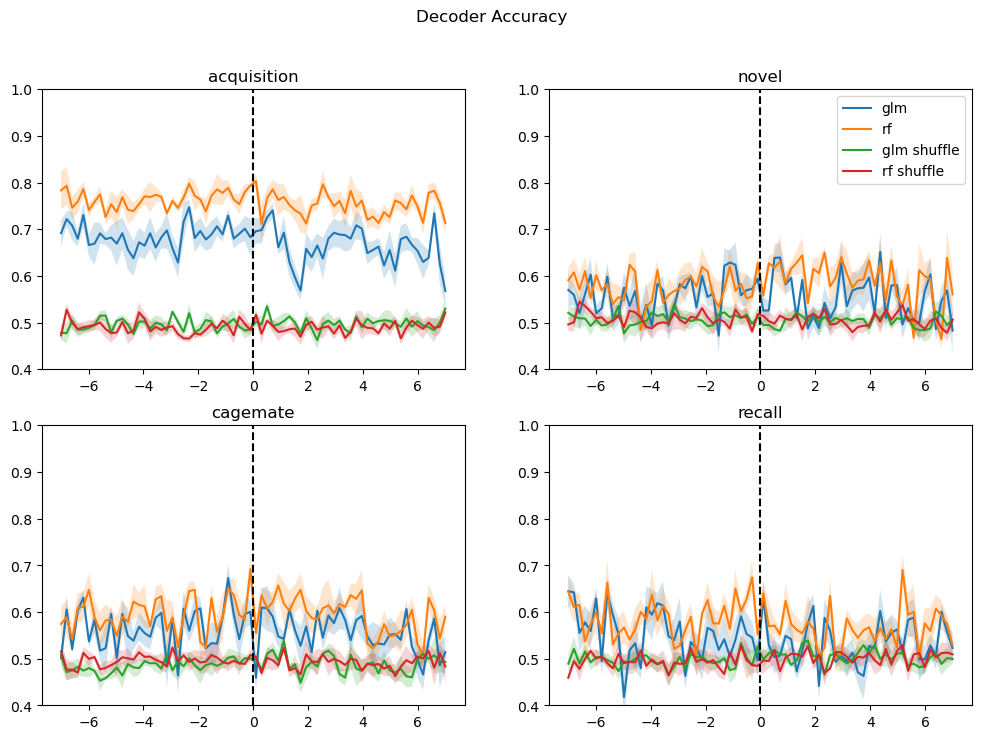

In [8]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 200,
                                                     ignore_freq=0.5)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 7, pre_window = 7, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 20, events = ['acquisition', 'novel', 'cagemate', 'recall'])


All set to analyze


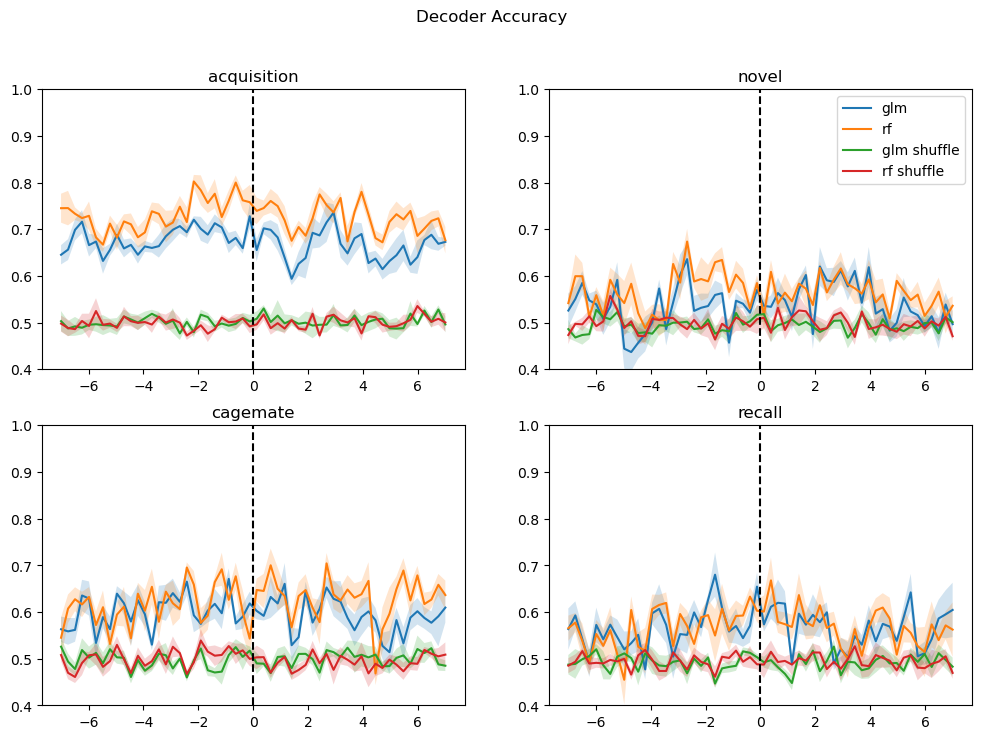

In [9]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 250,
                                                     ignore_freq=0.5)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 7, pre_window = 7, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 20, events = ['acquisition', 'novel', 'cagemate', 'recall'])


All set to analyze


c:\Users\megha\anaconda3\envs\ephys_analysis\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


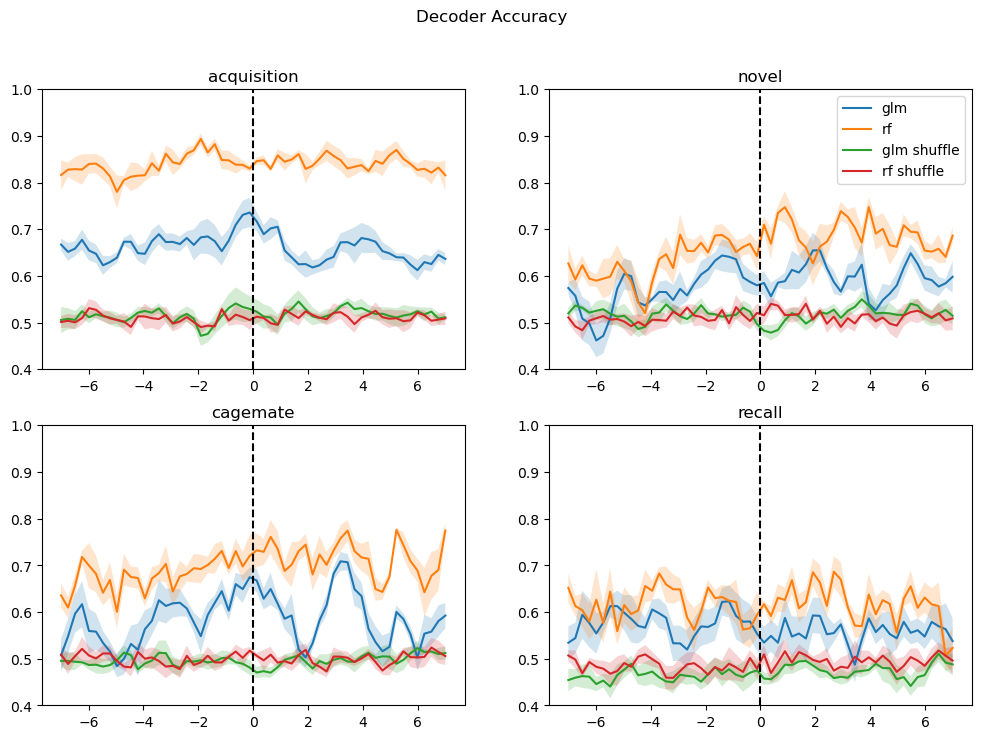

In [10]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 250,
                                                     ignore_freq=0.5,
                                                     smoothing_window = 750)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 7, pre_window = 7, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 20, events = ['acquisition', 'novel', 'cagemate', 'recall'])


All set to analyze


c:\Users\megha\anaconda3\envs\ephys_analysis\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\megha\anaconda3\envs\ephys_analysis\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_

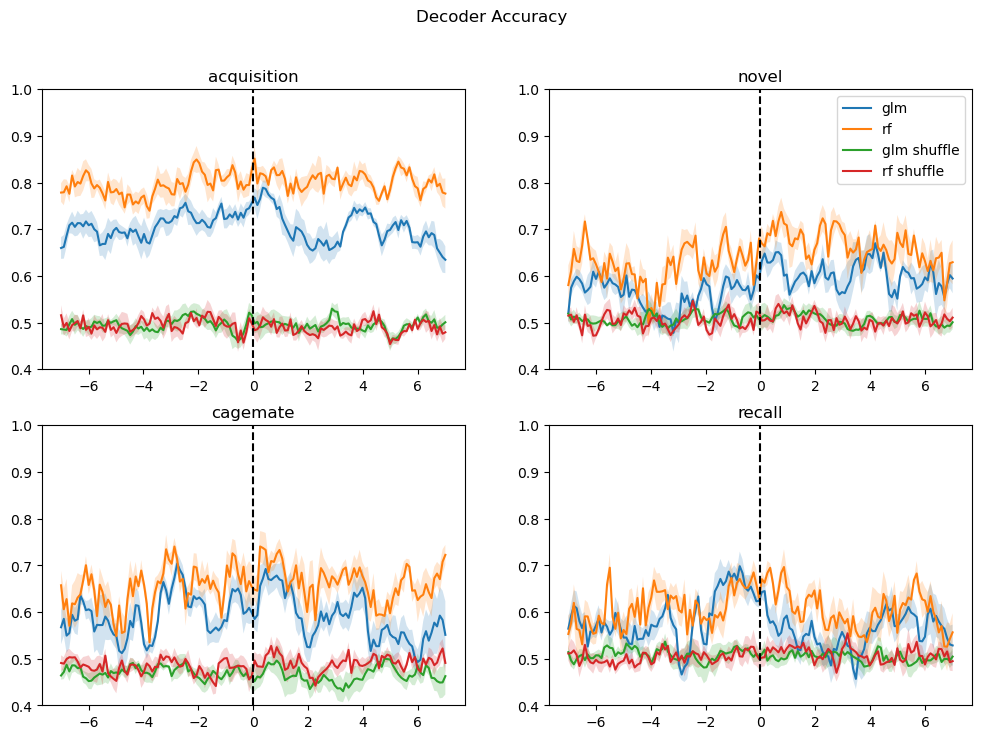

In [11]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 100,
                                                     ignore_freq=0.5,
                                                     smoothing_window = 500)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 7, pre_window = 7, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 20, events = ['acquisition', 'novel', 'cagemate', 'recall'])


All set to analyze


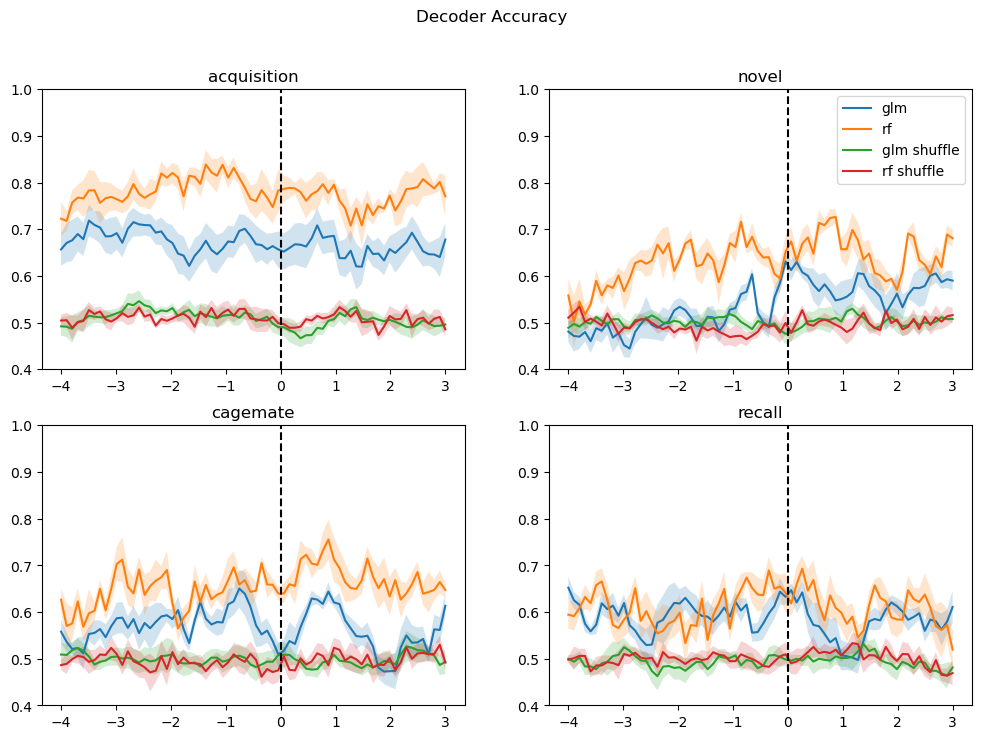

In [12]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 100,
                                                     ignore_freq=0.5,
                                                     smoothing_window = 500)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 3,
                                            pre_window = 4,
                                            post_window = 0,
                                            num_fold=5,
                                            num_shuffle=5,
                                            no_PCs= 40, 
                                            events = ['acquisition', 'novel', 'cagemate', 'recall'])


All set to analyze


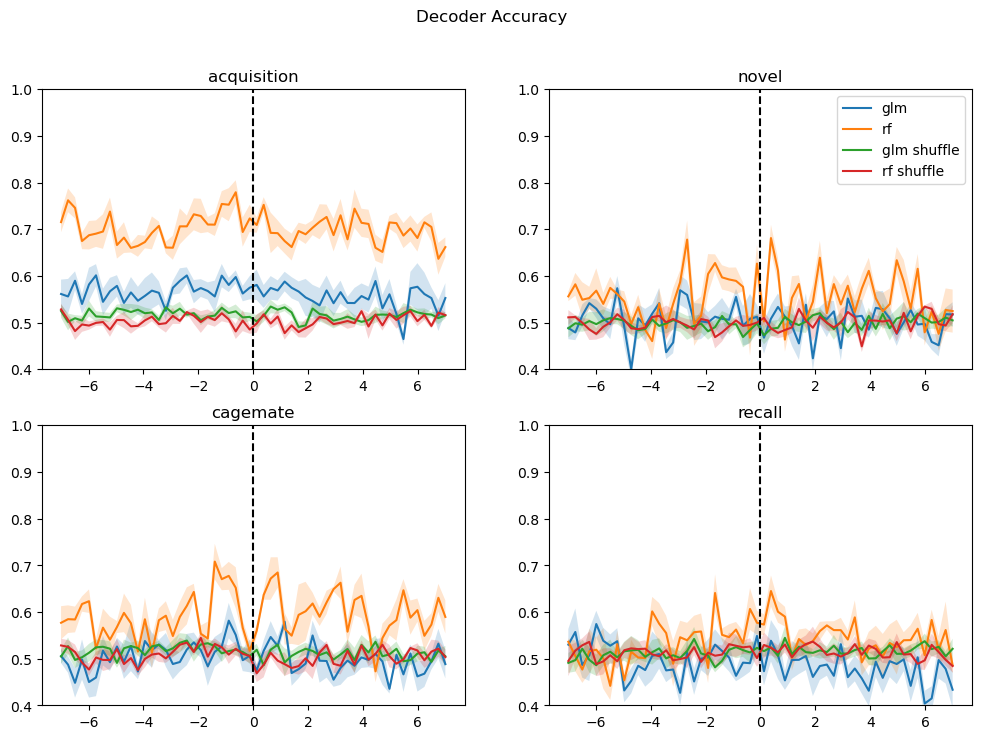

In [35]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection, timebin = 250, ignore_freq=0.5)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 7, pre_window = 7, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['acquisition', 'novel', 'cagemate', 'recall'])

### 250 smoothing Window 100 ms Timebin

In [ ]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection, 250, 100, 0.5)

All set to analyze


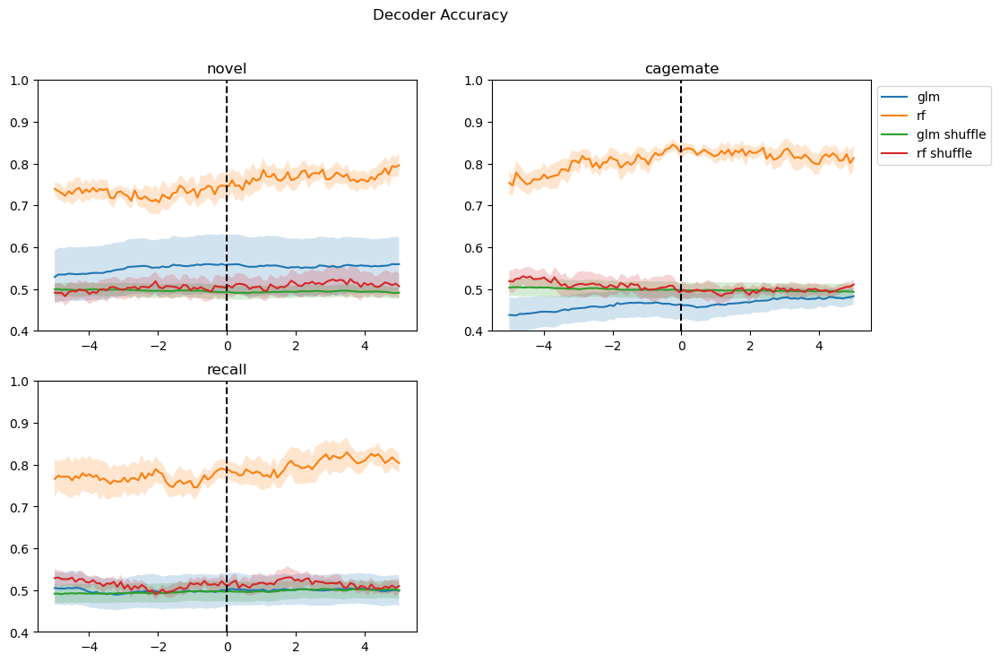

In [ ]:
[sm_250_tb_100_5_5, prob_id] = phase2_analysis.trial_decoder(equalize = 5, pre_window = 5, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['novel', 'cagemate', 'recall'])


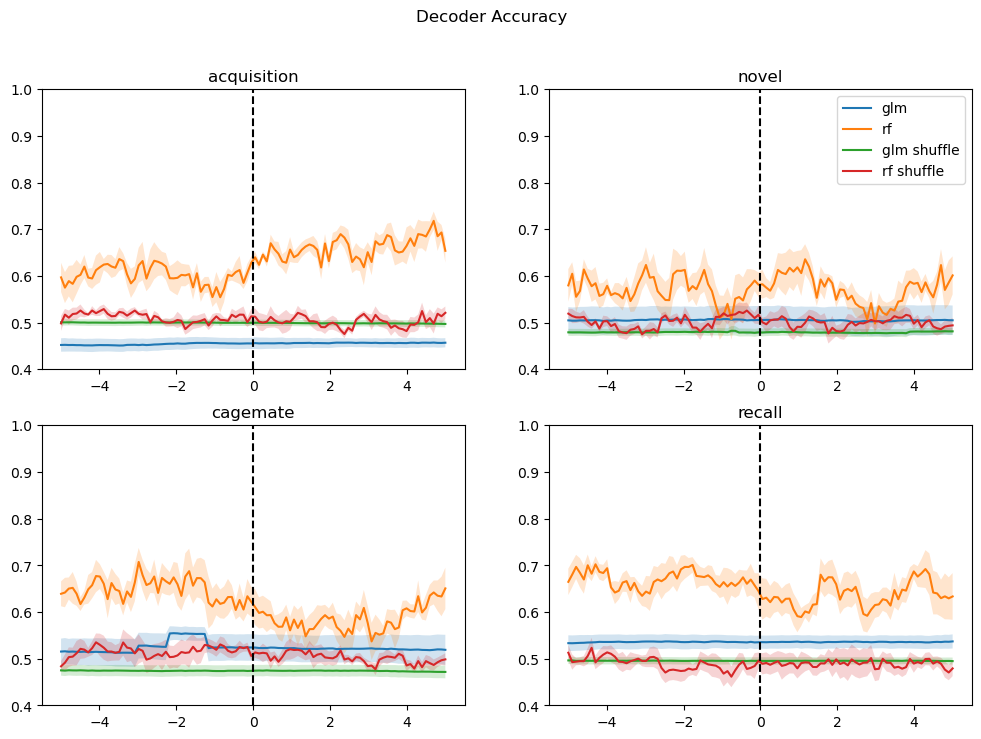

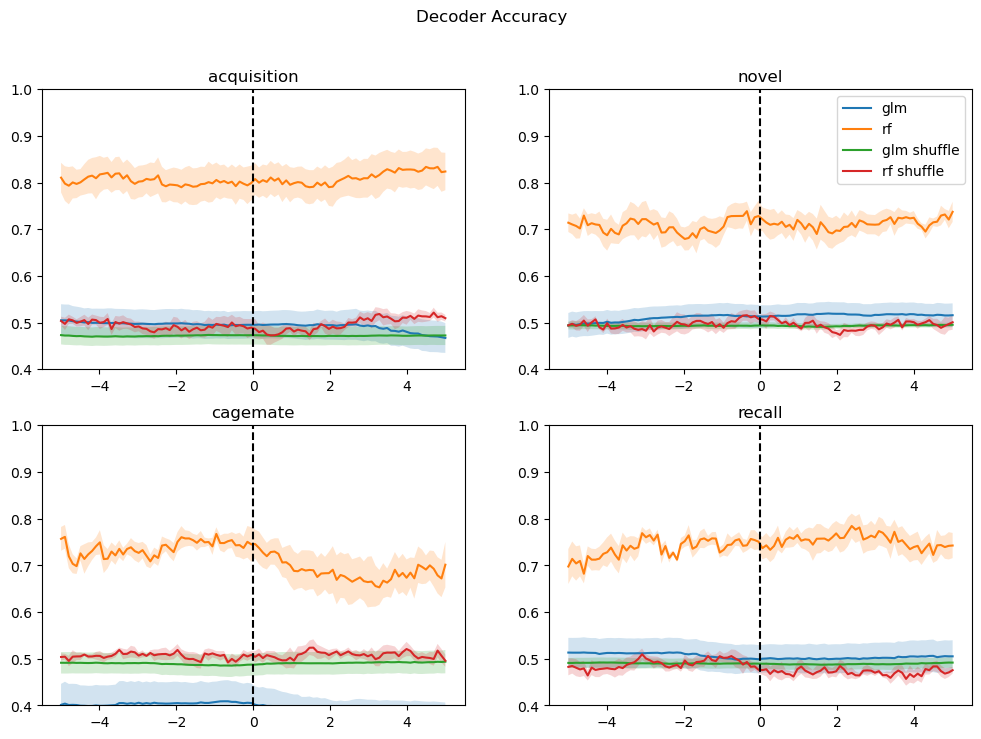

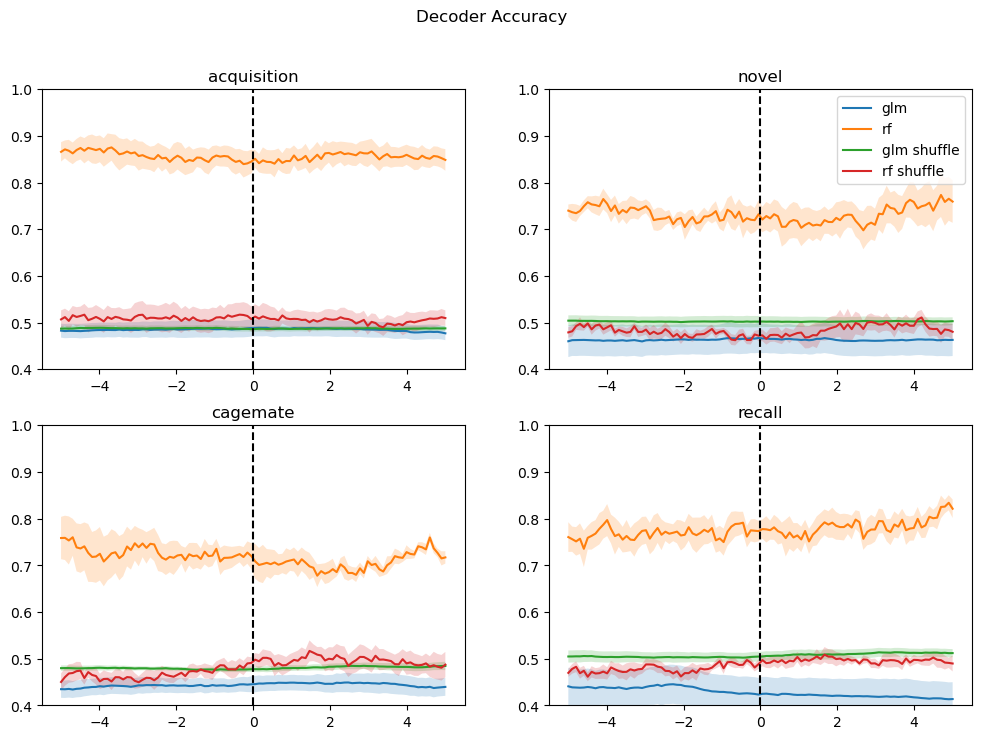

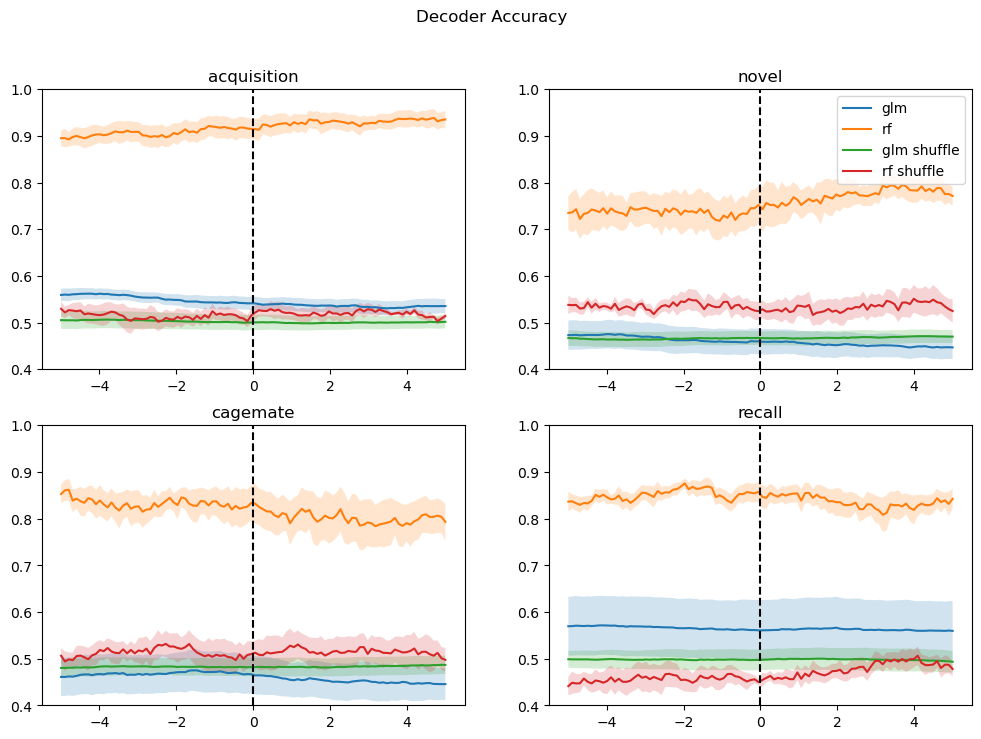

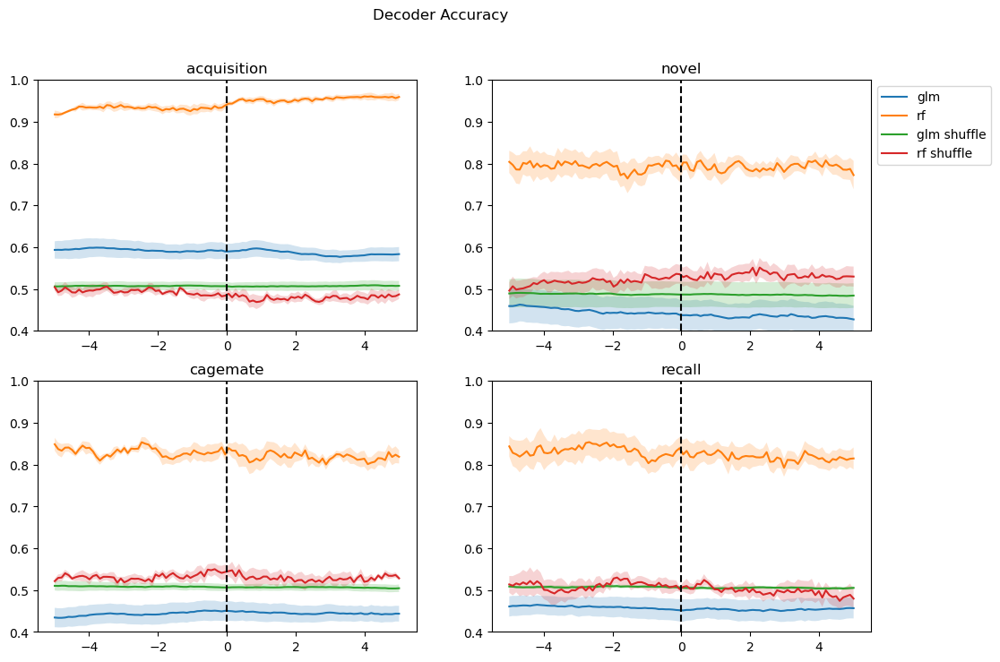

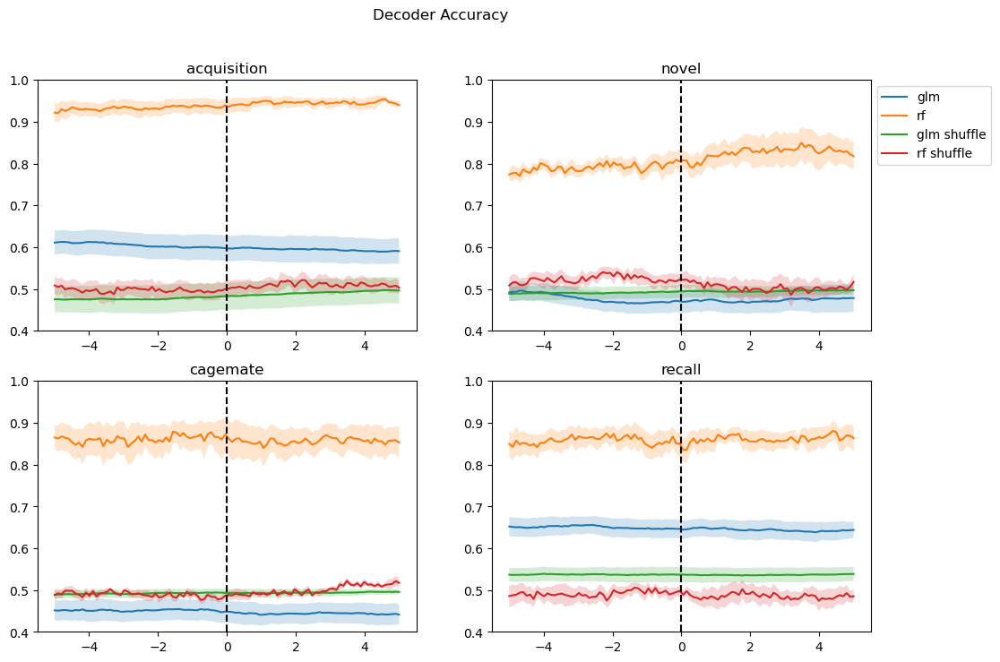

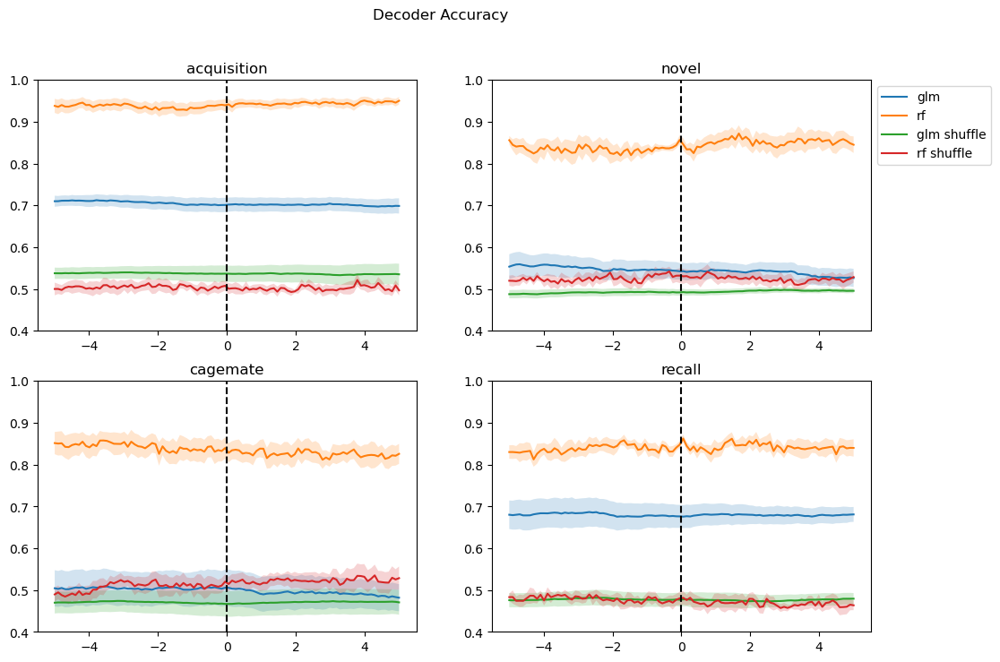

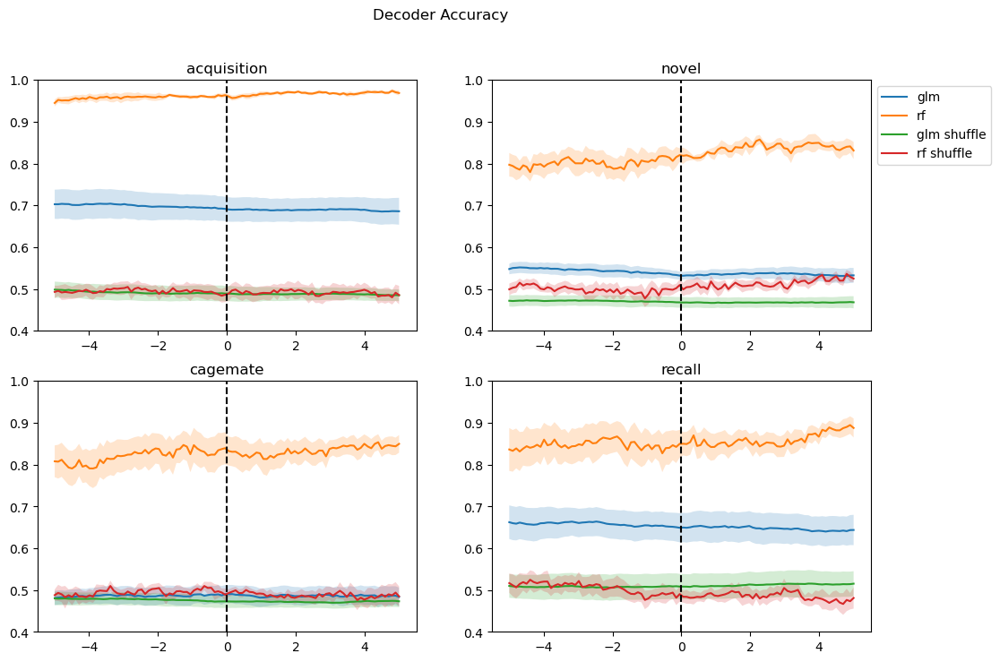

In [ ]:
all_4_larger_timebins = {}
for pc in range(1,9):
        all_4_larger_timebins[pc] = phase2_analysis.trial_decoder(equalize = 5, pre_window = 5, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= pc, events = ['acquisition', 'novel', 'cagemate', 'recall'])

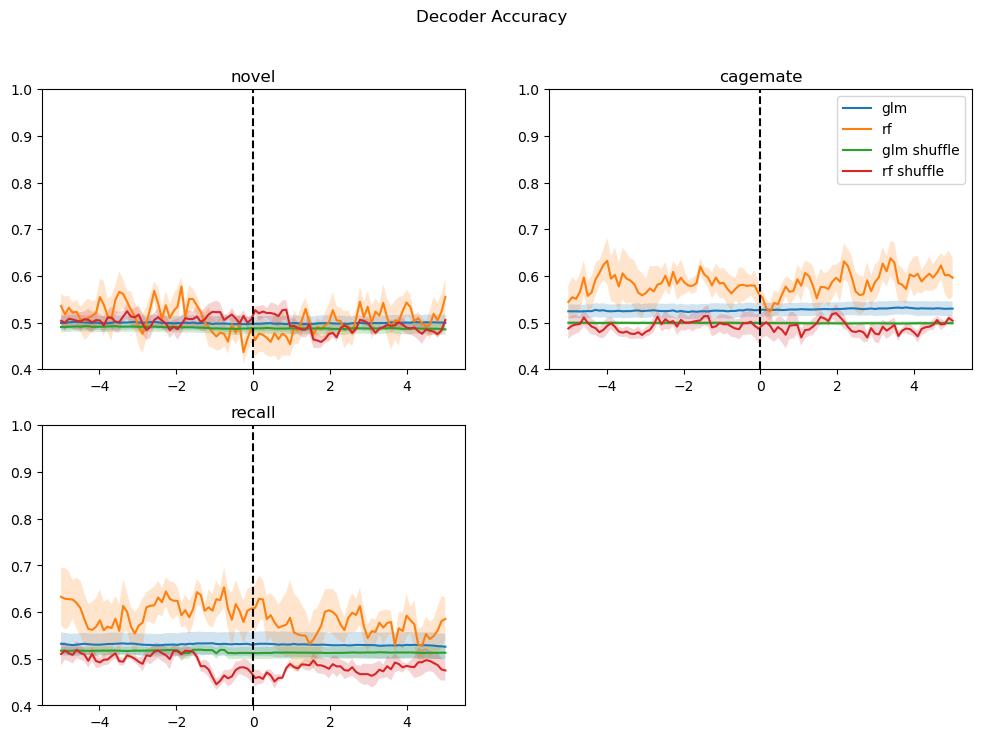

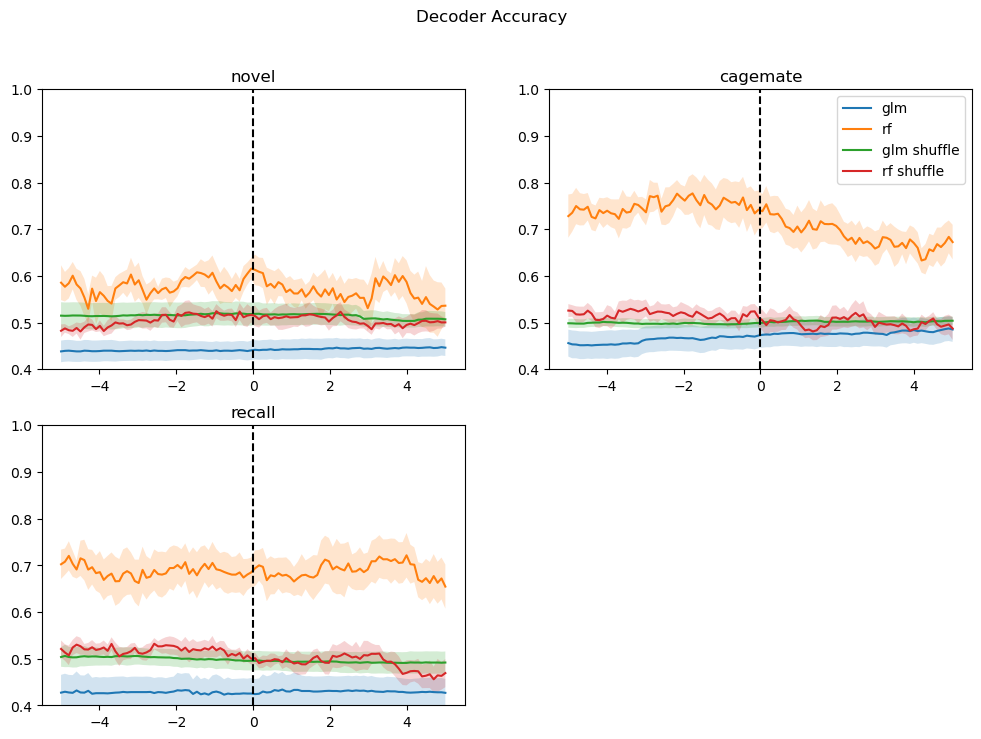

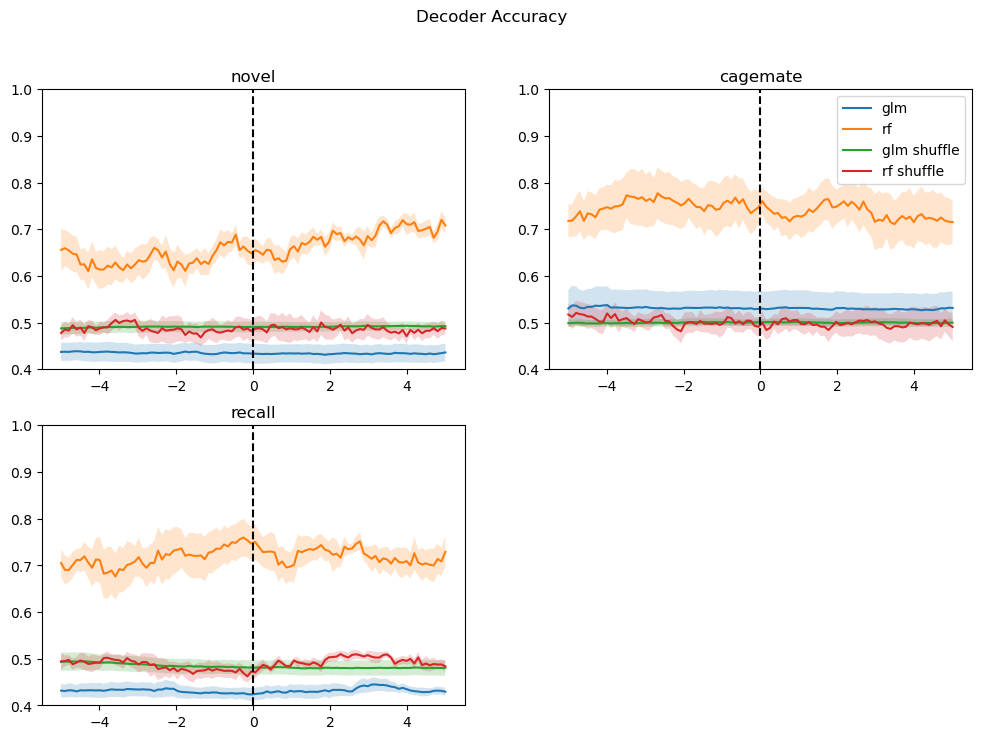

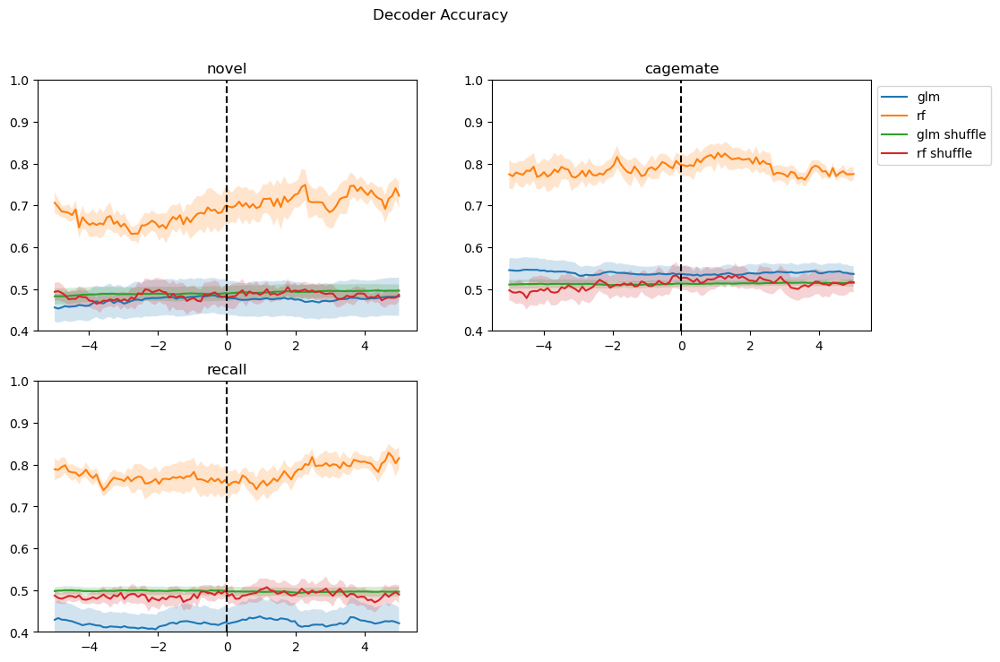

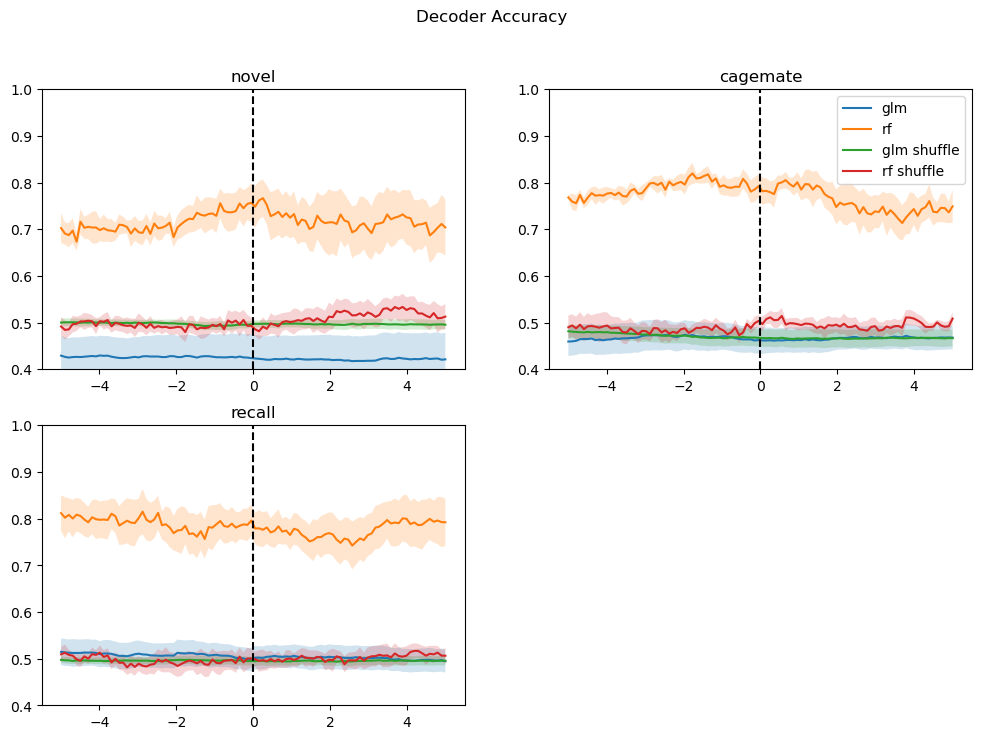

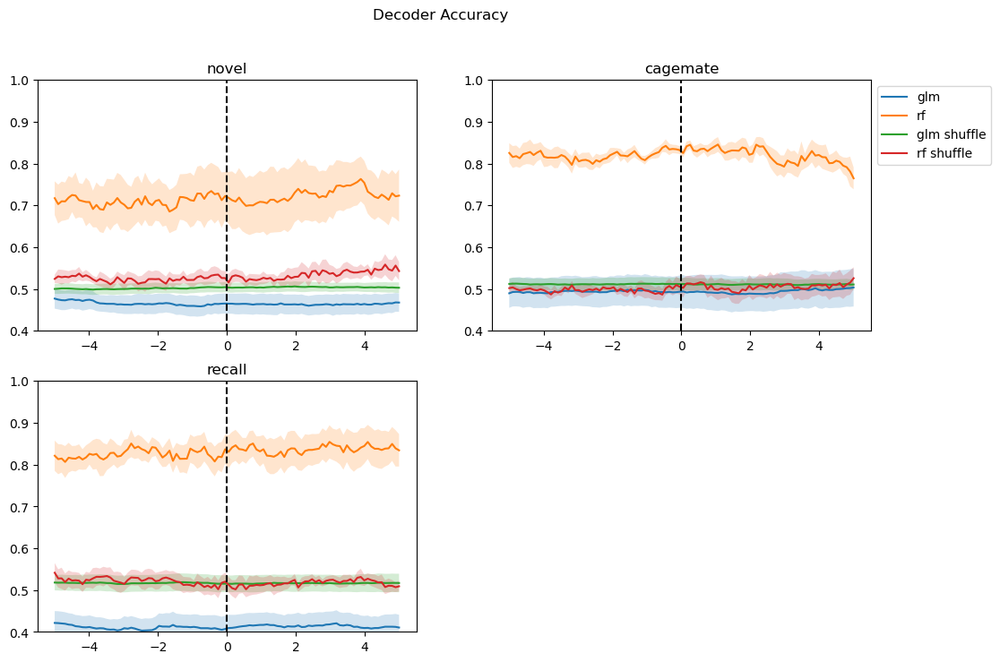

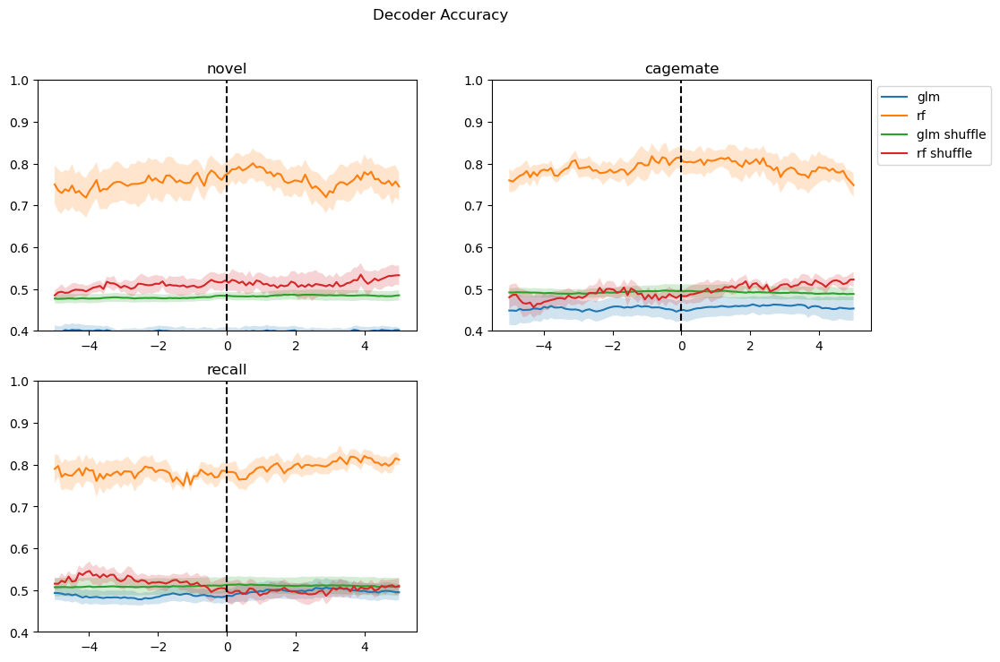

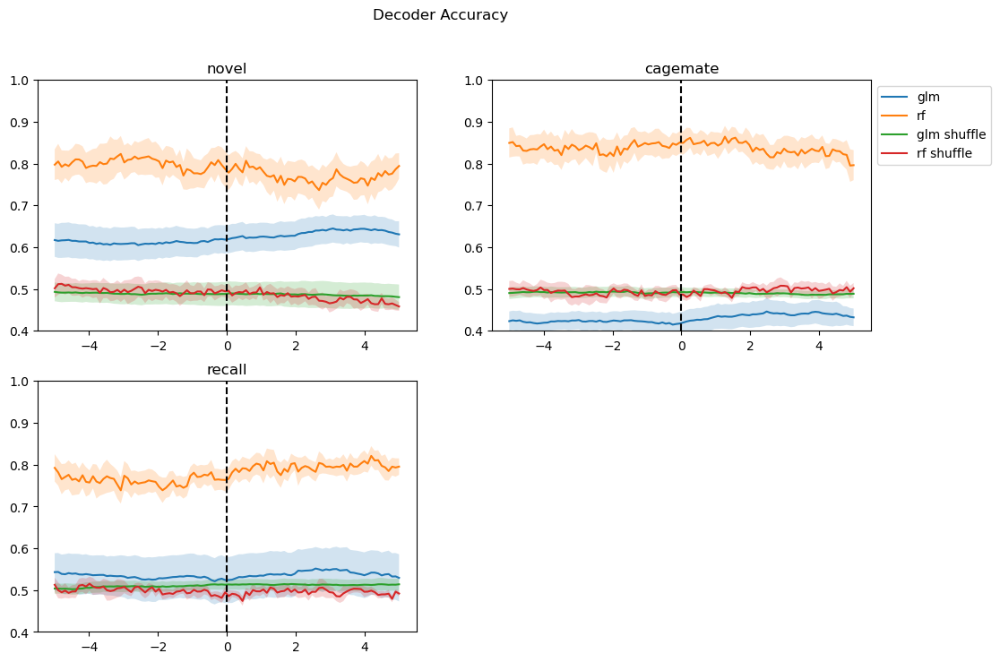

In [ ]:
all_3_larger_timebins = {}
for pc in range(1,9):
        all_3_larger_timebins[pc] = phase2_analysis.trial_decoder(equalize = 5, pre_window = 5, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= pc, events = ['novel', 'cagemate', 'recall'])

### Plotting across PCS

In [ ]:
all_3_larger_timebins.keys()
all_3_larger_timebins[1][0].keys()
pickle_this(all_3_larger_timebins, 'three_agents_acrossPCs.pkl')
pickle_this(all_4_larger_timebins, 'four_agents_acrossPCs.pkl')

In [ ]:
agents_three = across_pcs_auc(all_3_larger_timebins, 0, 3, 100, 5)
agents_four

In [ ]:
pca_df, coeff, var = phase2_analysis.PCA_trajectories(5, 5, events= ['recall', 'novel', 'cagemate'], plot = False)
total_var = 0
for variance in var[0:11]:
    total_var =+ total_var + variance
    print(total_var)

0.561891423505055
0.9636331467758292
0.9811853895053112
0.9919800682722205
0.9959653909663847
0.9969345729789654
0.9976778773318299
0.9981752626963697
0.9985386876233298
0.9988153367716313
0.9990253793088829


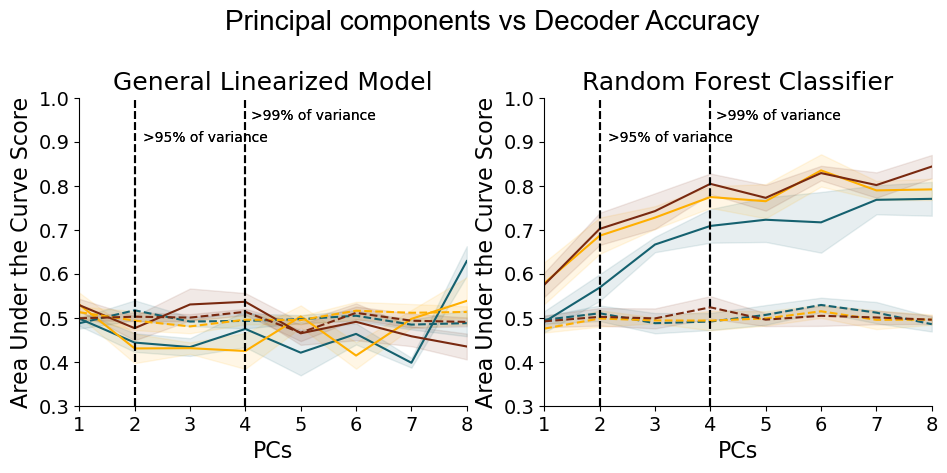

In [ ]:

plt.figure(figsize=(11,4))
linestyle = ['-', '--','-', '--']
i = 0
subplots = [1,1,2,2]
alpha = 0.1
for model in agents_three[1].keys():
    plt.subplot(1,2,subplots[i])
    novel_avg = []
    novel_sem = []
    cagemate_avg = []
    cagemate_sem = []
    familiar_avg = []
    familiar_sem = []
    for pc in agents_three.keys():
        novel_avg.append(np.mean(agents_three[pc][model]['novel'], axis = 0))
        novel_sem.append(sem(agents_three[pc][model]['novel']))
        cagemate_avg.append(np.mean(agents_three[pc][model]['cagemate'], axis = 0))
        cagemate_sem.append(sem(agents_three[pc][model]['cagemate']))
        familiar_avg.append(np.mean(agents_three[pc][model]['recall'], axis = 0))
        familiar_sem.append(sem(agents_three[pc][model]['recall']))
    x = list(agents_three.keys())
    plt.plot(x, novel_avg, label ='novel', color=hex_2_rgb('#15616F'), linestyle = linestyle[i])
    plt.fill_between(x, np.array(novel_avg)-np.array(novel_sem), np.array(novel_avg)+np.array(novel_sem),color=hex_2_rgb('#15616F'), alpha= alpha)
    plt.plot(x, familiar_avg, label = 'familiar', color = (1.0, 0.6862745098039216, 0.0), linestyle = linestyle[i])
    plt.fill_between(x, np.array(familiar_avg)-np.array(familiar_sem), np.array(familiar_avg)+np.array(familiar_sem), color = (1.0, 0.6862745098039216, 0.0), alpha = alpha)
    plt.plot(x, cagemate_avg, label = 'cagemate', color=hex_2_rgb('#792910'), linestyle = linestyle[i])
    plt.fill_between(x, np.array(cagemate_avg)-cagemate_sem, np.array(cagemate_avg)+np.array(cagemate_sem),color=hex_2_rgb('#792910'), alpha = alpha)
    plt.ylim(0.3, 1)
    plt.xlim(1,8)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('PCs', fontsize=16)
    plt.ylabel('Area Under the Curve Score', fontsize=16)
    plt.axvline(x=4, color='k', linestyle='--', label = '>99% of variance')
    plt.axvline(x=2, color='k', linestyle='--', label  = '>95% of variance')
    plt.text(4.1,.95,'>99% of variance')
    plt.text(2.15,.9,'>95% of variance')
    if subplots[i] == 1:
        plt.title('General Linearized Model', fontsize = 18)
    else:
        plt.title('Random Forest Classifier', fontsize = 18)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    i +=1
plt.suptitle('Principal components vs Decoder Accuracy', fontsize = 20, font = 'Arial', y = 1.1)
plt.show()



In [ ]:
collpased_pc_dict = across_pcs_auc(all_4_larger_timebins, 0, 3, 100, 5)


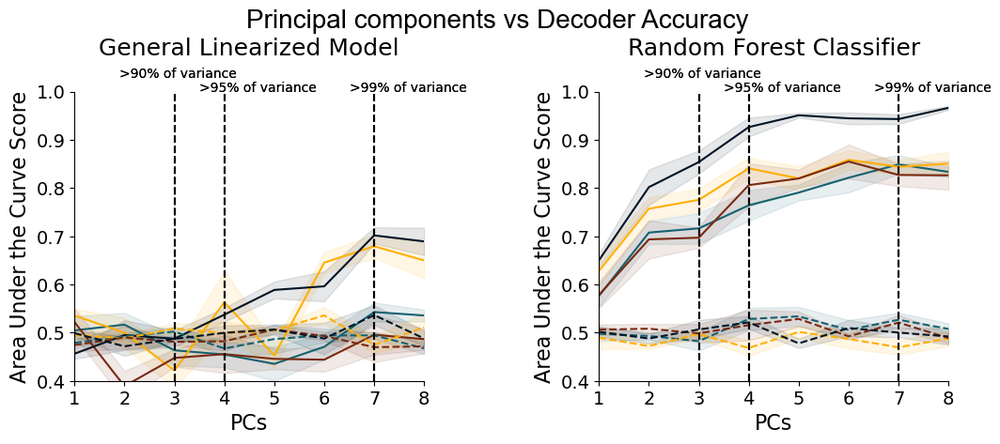

In [ ]:
plt.figure(figsize=(12,4))
linestyle = ['-', '--','-', '--']
i = 0
subplots = [1,1,2,2]
for model in collpased_pc_dict[1].keys():
    plt.subplot(1,2,subplots[i])
    novel_avg = []
    novel_sem = []
    cagemate_avg = []
    cagemate_sem = []
    familiar_avg = []
    familiar_sem = []
    acquisition_avg = []
    acquisition_sem = []
    for pc in collpased_pc_dict.keys():
        novel_avg.append(np.mean(collpased_pc_dict[pc][model]['novel'], axis = 0))
        novel_sem.append(sem(collpased_pc_dict[pc][model]['novel']))
        cagemate_avg.append(np.mean(collpased_pc_dict[pc][model]['cagemate'], axis = 0))
        cagemate_sem.append(sem(collpased_pc_dict[pc][model]['cagemate']))
        familiar_avg.append(np.mean(collpased_pc_dict[pc][model]['recall'], axis = 0))
        familiar_sem.append(sem(collpased_pc_dict[pc][model]['recall']))
        acquisition_avg.append(np.mean(collpased_pc_dict[pc][model]['acquisition'], axis = 0))
        acquisition_sem.append(sem(collpased_pc_dict[pc][model]['acquisition']))
    x = list(collpased_pc_dict.keys())
    plt.plot(x, novel_avg, label ='novel', color=hex_2_rgb('#15616F'), linestyle = linestyle[i])
    plt.fill_between(x, np.array(novel_avg)-np.array(novel_sem), np.array(novel_avg)+np.array(novel_sem),color=hex_2_rgb('#15616F'), alpha= alpha)
    plt.plot(x, familiar_avg, label = 'familiar', color = (1.0, 0.6862745098039216, 0.0), linestyle = linestyle[i])
    plt.fill_between(x, np.array(familiar_avg)-np.array(familiar_sem), np.array(familiar_avg)+np.array(familiar_sem), color = (1.0, 0.6862745098039216, 0.0), alpha = alpha)
    plt.plot(x, cagemate_avg, label = 'cagemate', color=hex_2_rgb('#792910'), linestyle = linestyle[i])
    plt.fill_between(x, np.array(cagemate_avg)-cagemate_sem, np.array(cagemate_avg)+np.array(cagemate_sem),color=hex_2_rgb('#792910'), alpha = alpha)
    plt.plot(x, acquisition_avg, label = 'acquisition', color=hex_2_rgb('#001424'), linestyle = linestyle[i])
    plt.fill_between(x, np.array(acquisition_avg)-np.array(acquisition_sem), np.array(acquisition_avg)+np.array(acquisition_sem),color=hex_2_rgb('#001424'), alpha = alpha)
    plt.axvline(x=4, color='k', linestyle='--', label = '>99% of variance')
    plt.axvline(x=7, color='k', linestyle='--', label  = '>95% of variance')
    plt.axvline(x=3, color='k', linestyle='--', label  = '>95% of variance')
    plt.text(3.5,1,'>95% of variance')
    plt.text(1.9, 1.03,'>90% of variance')
    plt.text(6.5,1,'>99% of variance')
    plt.ylim(0.4, 1)
    plt.xlim(1,8)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('PCs', fontsize=16)
    plt.ylabel('Area Under the Curve Score', fontsize=16)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if subplots[i] == 1:
        plt.title('General Linearized Model', y = 1.1, fontsize = 18)
    else:
        plt.title('Random Forest Classifier', y = 1.1, fontsize = 18)
    i +=1
plt.suptitle('Principal components vs Decoder Accuracy', fontsize = 20, font = 'Arial', y = 1.1)
plt.subplots_adjust(wspace=0.5)
plt.show()


### Fig1 a. results + plotting

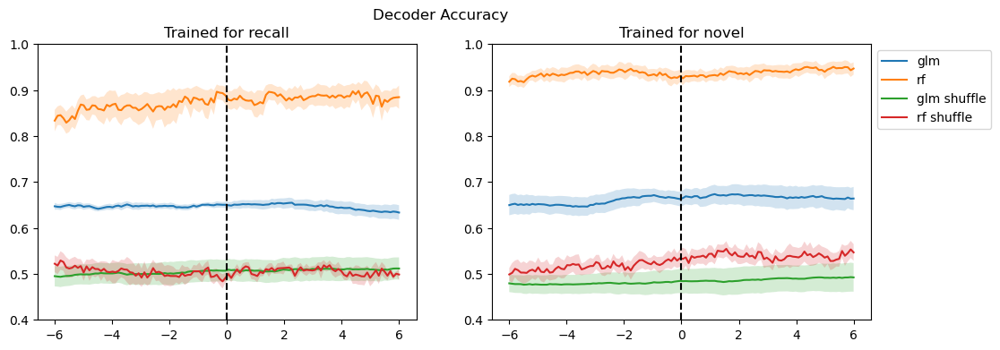

In [ ]:
nov_acq_v_fam_auc = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='acquisition', event1='recall', event2='novel')    



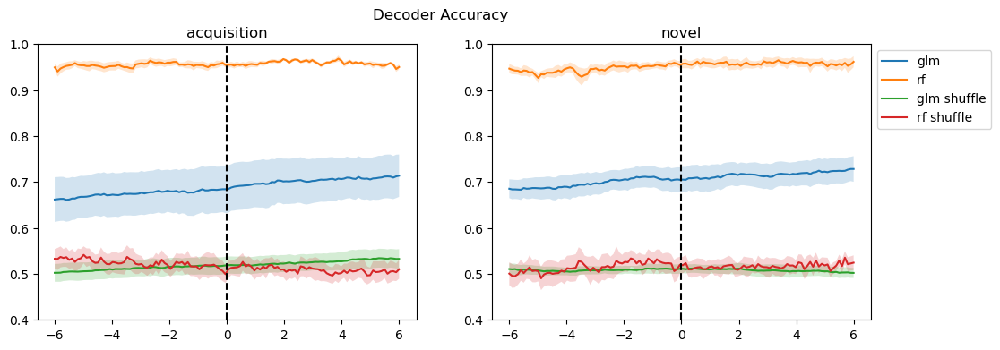

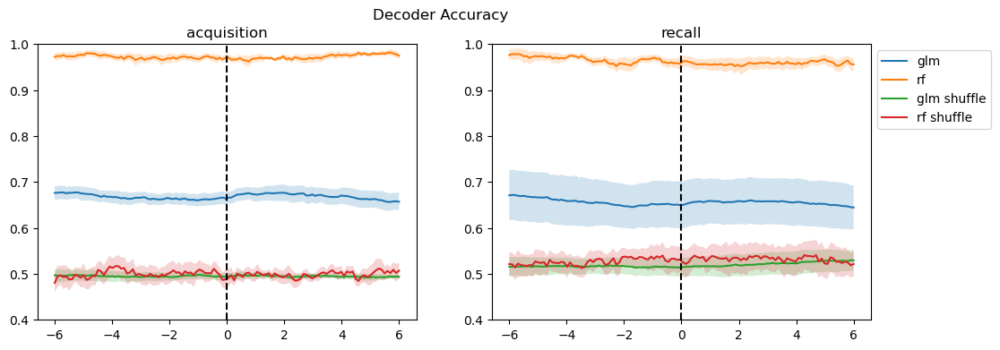

In [ ]:
acq_vs_novel_baseline = phase2_analysis.trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['acquisition','novel'])
acq_vs_recall_baseline = phase2_analysis.trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['acquisition','recall'])

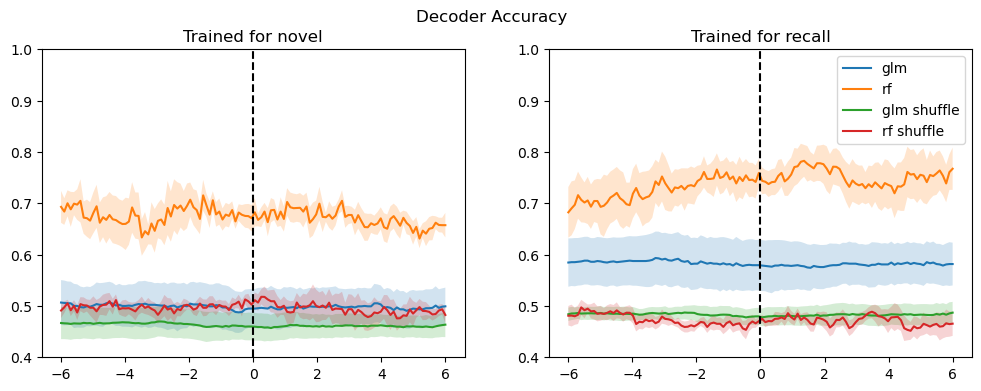

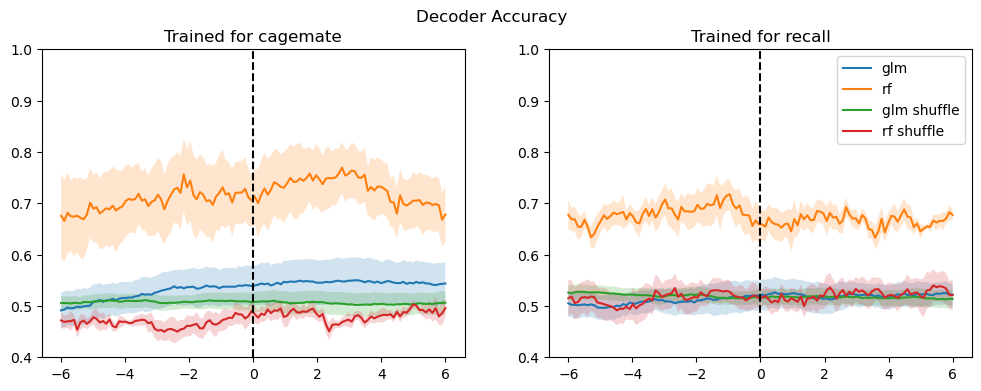

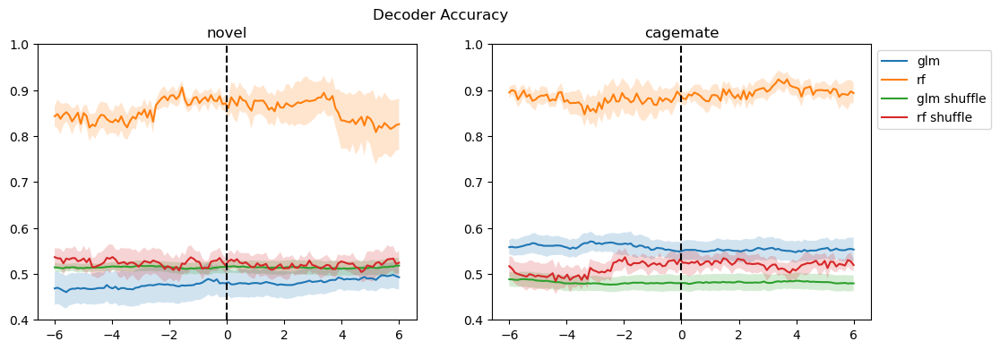

In [ ]:
cagemate_v_other = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='cagemate', event1='novel', event2='recall')
novel_v_fam = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='novel', event1='cagemate', event2='recall')


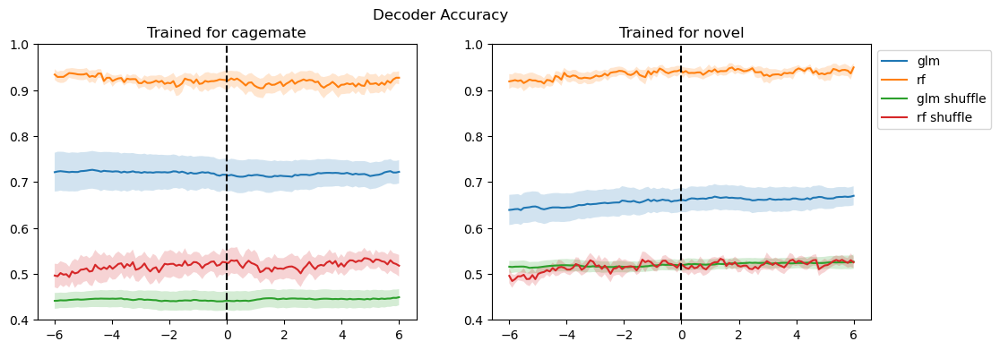

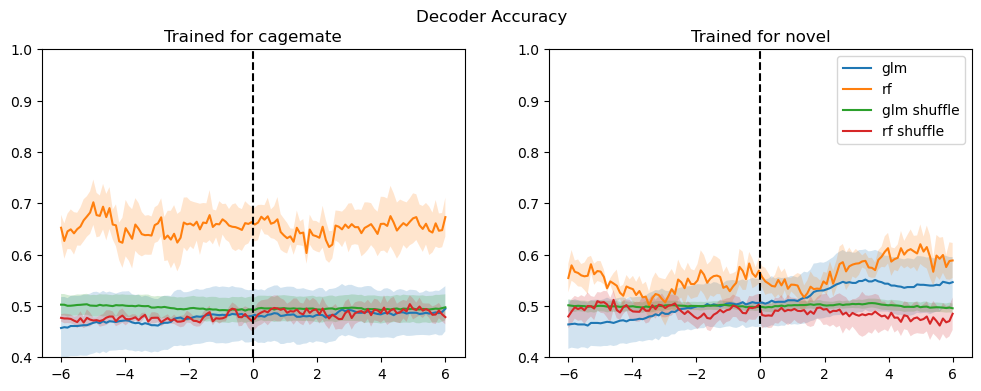

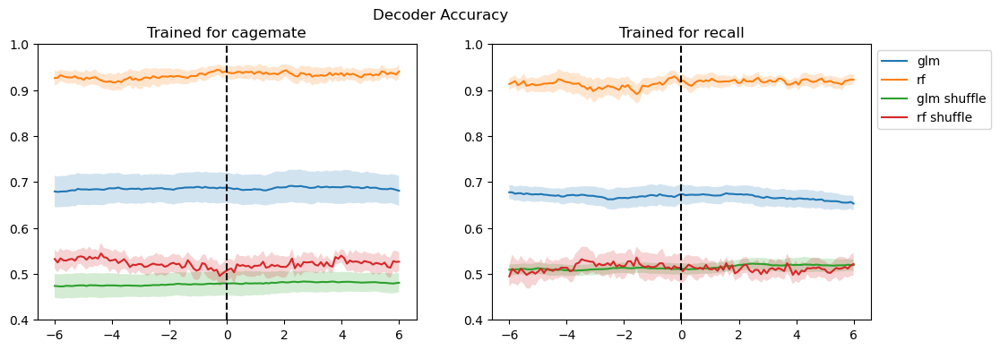

In [ ]:
nov_acq_v_fam_auc = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='acquisition', event1='cagemate', event2='novel')
fam_v_other = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='recall', event1='cagemate', event2='novel')
acq_v_fam = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='acquisition', event1='cagemate', event2='recall')

### Binary Decoder + Plotting

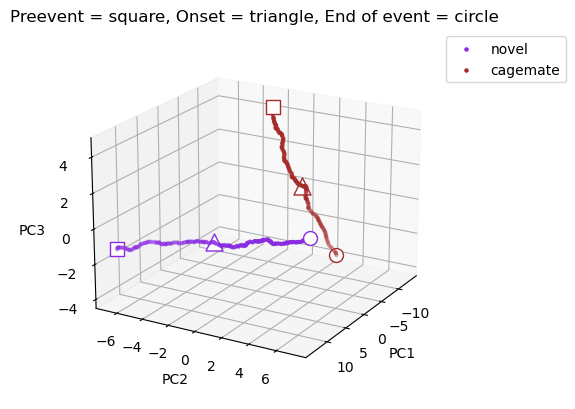

0.9203729947694579
0.9763924614041647
0.9913003491963772
0.994263684236341
0.9960897408499397
0.9973738874379409
0.9982075783067571
0.9985758276573575
0.9988312027699319
0.999062162334466


In [ ]:
pca_df, coeff, var = phase2_analysis.PCA_trajectories(6, 6, d = 3, events = ['novel','cagemate'])

total_variance = 0
for variance in var[0:10]:
    total_variance =+ total_variance + variance
    print(total_variance)


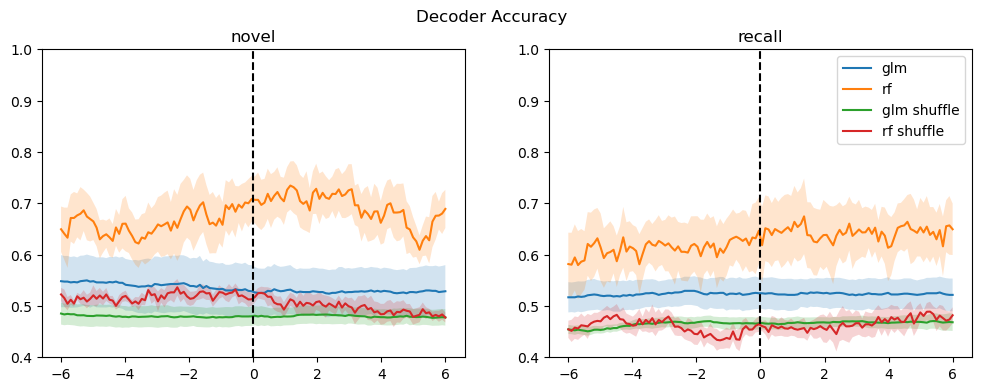

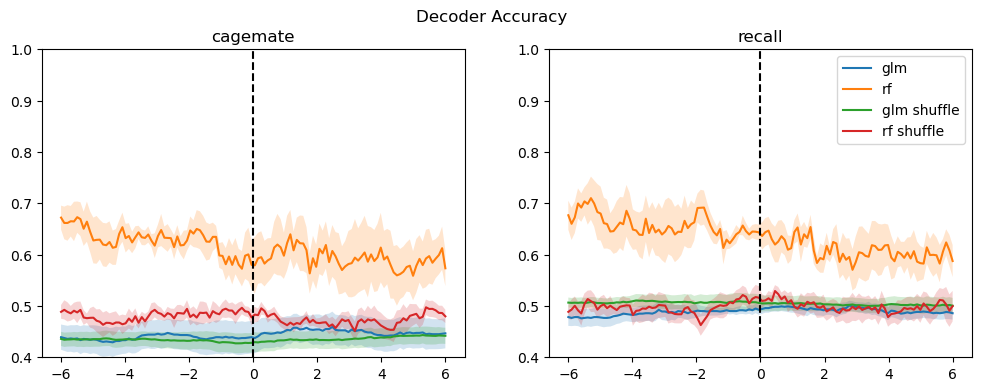

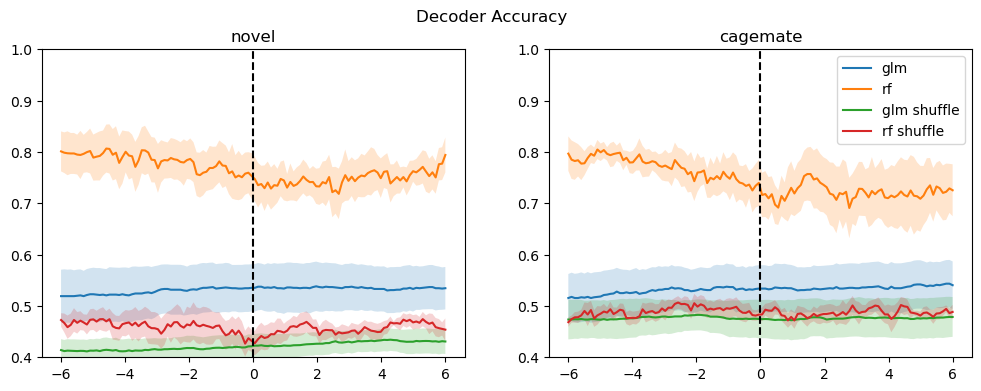

In [ ]:
equalize = 6
pre_window = 6
post_window = 0
num_fold = 5
num_shuffle = 5
no_PCs = 
novel_vs_familiar_baseline = phase2_analysis.trial_decoder(
    equalize = equalize, 
    pre_window = pre_window,
    post_window = post_window,
    num_fold = num_fold,
    num_shuffle = num_shuffle,
    no_PCs = no_PCs,
    events = ['novel','recall'])
cagemate_vs_familiar_baseline = phase2_analysis.trial_decoder(
    equalize = equalize, 
    pre_window = pre_window,
    post_window = post_window,
    num_fold = num_fold,
    num_shuffle = num_shuffle,
    no_PCs = no_PCs,
    events = ['cagemate','recall'])
novel_vs_cagemate_baseline = phase2_analysis.trial_decoder(
    equalize = equalize, 
    pre_window = pre_window,
    post_window = post_window,
    num_fold = num_fold,
    num_shuffle = num_shuffle,
    no_PCs = no_PCs,
    events = ['novel','cagemate'])

In [ ]:
pickle_this(one_a_dict_baselines, 'pc3_binarydict.pkl')

In [ ]:
one_a_dict = {'novel vs long-term': novel_vs_cagemate_baseline['cagemate'], 
              'short-term vs long-term': cagemate_v_other['novel'],
              'novel vs short-term': novel_v_fam['cagemate']}
auc = one_a_dict
new_dict = collapsed_auc_dict(auc, 0, 3, 100, 6)
pre_window = 5
equalize = 5
avg_auc = {}
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['novel vs long-term', 'short-term vs long-term', 'novel vs short-term'] # Example categories
ttests = {}
for key in new_dict.keys():
    results = {}
    for pair in combinations(categories, 2):
        t_stat, p_value = ttest_rel(new_dict[key][pair[0]],new_dict[key][pair[1]])
        results[pair] = [t_stat, p_value]
    ttests[key] = results

ttess_df = pd.DataFrame.from_dict(ttests)

print(ttess_df)
avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.3  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(9, 6))
col = [ hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1]
    hatches = ['','//','','//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor=edge[i], alpha=alphas[j], label=category if i == 0 else '', color = col[i], hatch=hatches[j])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend
# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories[i]) for i in range(len(col))]
# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 16.5, frameon= False, bbox_to_anchor=(0.53,1.05), title = 'Tested on:')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-105, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Decoder trained on novel vs long-term familiar', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

TypeError: list indices must be integers or slices, not str

                                                                  Generalized\nLinear Model  \
novel vs long-term      short-term vs long-term    [1.1132778986768634, 0.3279762528475643]   
                        novel vs short-term       [0.19375817921266483, 0.8558068566861955]   
short-term vs long-term novel vs short-term      [-1.6403790224593808, 0.17627008886156126]   

                                                                                  Shuffled   \
novel vs long-term      short-term vs long-term   [1.1815089591321548, 0.30284671468287017]   
                        novel vs short-term       [0.24367274135770836, 0.8194714491055105]   
short-term vs long-term novel vs short-term      [-1.4598129517839755, 0.21811775074193626]   

                                                                 Random Forest\nClassifier  \
novel vs long-term      short-term vs long-term   [2.662587088020478, 0.05623850443205985]   
                        novel vs short-term       

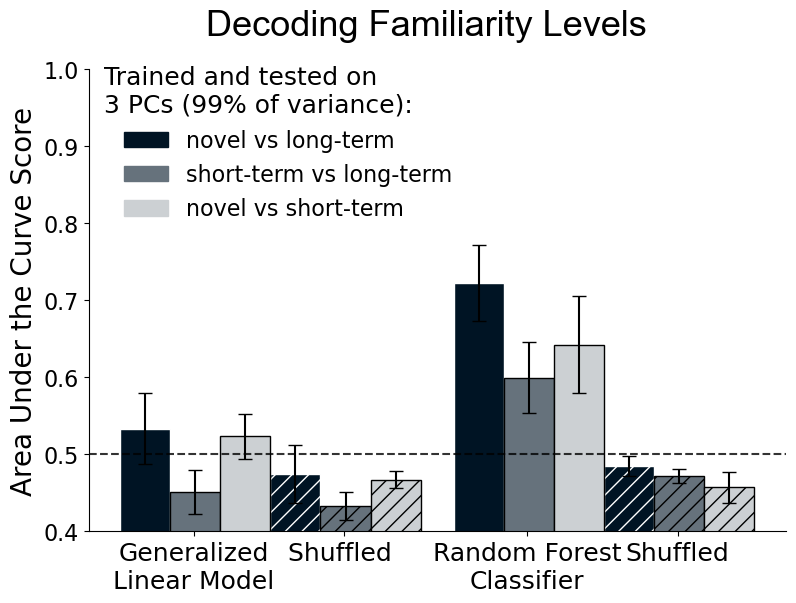

In [ ]:
one_a_dict_baselines = {'novel vs long-term': novel_vs_cagemate_baseline[0]['cagemate'], 
              'short-term vs long-term': cagemate_vs_familiar_baseline[0]['cagemate'],
              'novel vs short-term': novel_vs_familiar_baseline[0]['recall']}

auc = one_a_dict_baselines
new_dict = collapsed_auc_dict(auc, 0, 3, 100, 6)

from scipy.stats import ttest_rel
import matplotlib.patches as mpatches
pre_window = 5
equalize = 5
avg_auc = {}
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['novel vs long-term', 'short-term vs long-term', 'novel vs short-term'] # Example categories
ttests = {}
for key in new_dict.keys():
    results = {}
    for pair in combinations(categories, 2):
        t_stat, p_value = ttest_rel(new_dict[key][pair[0]],new_dict[key][pair[1]])
        results[pair] = [t_stat, p_value]
    ttests[key] = results

ttess_df = pd.DataFrame.from_dict(ttests)

print(ttess_df)
avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.3  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(9, 6))
col = [ hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1]
    hatches = ['','//','','//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor = edge[i], alpha=alphas[j], hatch = hatches[j], label=category if i == 0 else '', color = col[i])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend

# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories[i]) for i in range(len(col))]

# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 16, frameon= False, bbox_to_anchor=(0.55,1.05), title = 'Trained and tested on\n3 PCs (99% of variance):')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-30, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Decoding Familiarity Levels', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

### Fig1b. results and plotting

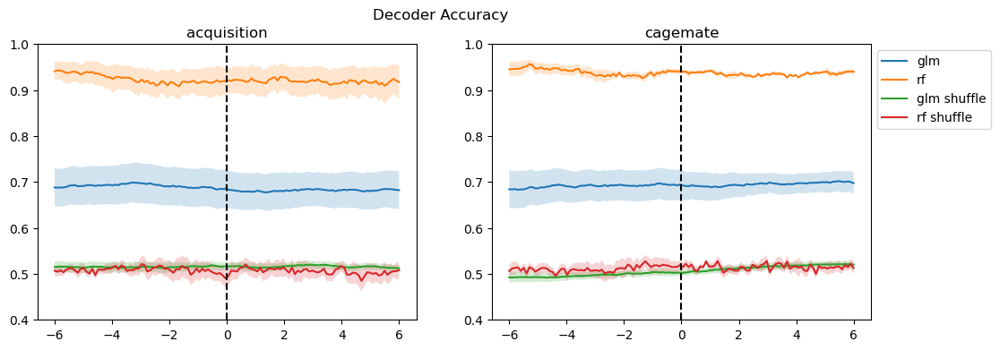

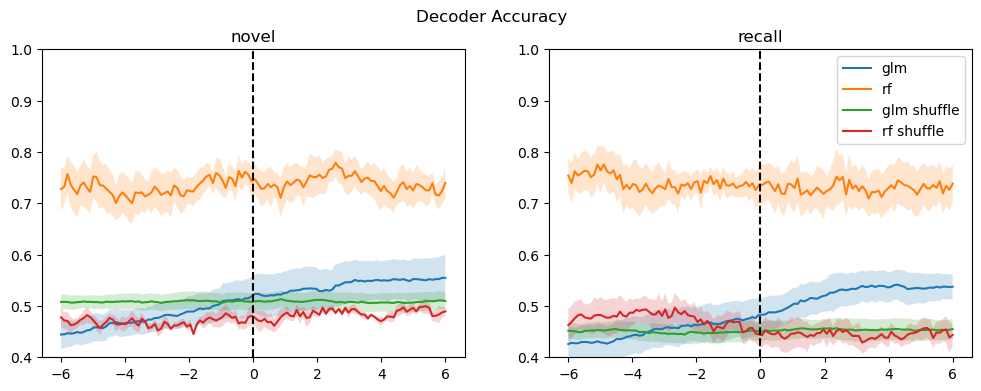

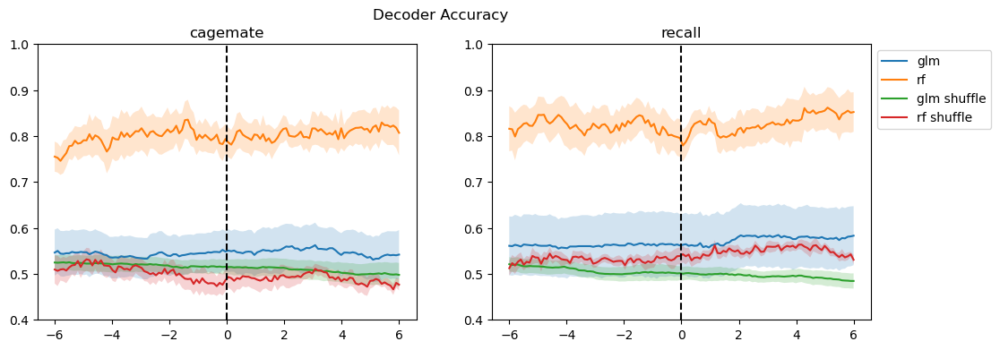

In [ ]:
acq_vs_cagemate_baseline = phase2_analysis.trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['acquisition','cagemate'])
novel_vs_familiar_baseline = phase2_analysis.trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['novel','recall'])
cagemate_vs_familiar_baseline = phase2_analysis.trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, events = ['cagemate','recall'])





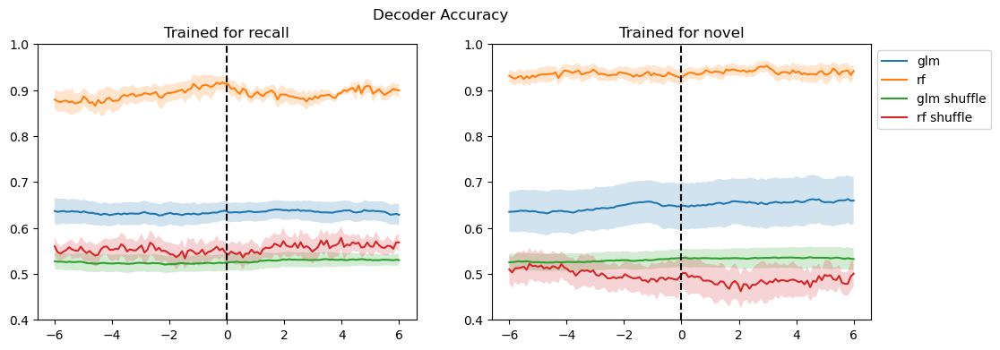

In [ ]:
nov_acq_v_recall_auc = cross_trial_decoder(equalize = 6, pre_window = 6, post_window = 0, num_fold=5, num_shuffle=5, no_PCs= 8, same_event='acquisition', event1='recall', event2='novel')


In [ ]:
acq_vs_novel_baseline
acq_vs_recall_baseline
acq_vs_cagemate_baseline
nov_acq_v_recall_auc (acq v (recall/novel) )
acq_v_fam (acq v (cagemate/fam))
nov_acq_v_fam_auc (acw v (cagemate/novel))

In [ ]:
one_b_dict_acq_fam = {'acquisition vs short-term': acq_vs_recall_baseline['acquisition'], 
              'acquisition vs novel': nov_acq_v_recall_auc['recall'],
              'acquisition vs long-term': acq_v_fam['recall']}

one_b_dict_acq_cagemate = {'acquisition vs long-term': acq_vs_cagemate_baseline['acquisition'], 
              'acquisition vs novel': nov_acq_v_fam_auc['cagemate'],
              'acquisition vs short-term': acq_v_fam['cagemate']}

one_b_dict_acq_nov = {'acquisition vs novel': acq_vs_novel_baseline['acquisition'], 
              'acquisition vs short-term': nov_acq_v_recall_auc['novel'],  
              'acquisition vs long-term': nov_acq_v_fam_auc['novel']}

one_b_baselines = {'acquisition vs novel': acq_vs_novel_baseline['acquisition'],
                    'acquisition vs short-term': acq_vs_recall_baseline['acquisition'],
                    'acquisition vs long-term': acq_vs_cagemate_baseline['acquisition']}


one_b_results = [one_b_dict_acq_fam, one_b_dict_acq_nov, one_b_dict_acq_cagemate, one_b_baselines]
collapsed_one_b_results = []
for auc in one_b_results:
    collapsed_one_b_results.append(collapsed_auc_dict(auc, 0, 3, 100, 6))





In [ ]:
for one_bdict in collapsed_one_b_results:
    print(one_bdict['Shuffled'].keys())

dict_keys(['acquisition vs short-term', 'acquisition vs novel', 'acquisition vs long-term'])
dict_keys(['acquisition vs novel', 'acquisition vs short-term', 'acquisition vs long-term'])
dict_keys(['acquisition vs long-term', 'acquisition vs novel', 'acquisition vs short-term'])
dict_keys(['acquisition vs novel', 'acquisition vs short-term', 'acquisition vs long-term'])


In [ ]:
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['novel vs long-term', 'short-term vs long-term', 'novel vs short-term'] # Example categories
ttests = {}
for key in new_dict.keys():
    results = {}
    for pair in combinations(categories, 2):
        t_stat, p_value = ttest_rel(new_dict[key][pair[0]],new_dict[key][pair[1]])
        results[pair] = [t_stat, p_value]
    ttests[key] = results

ttess_df = pd.DataFrame.from_dict(ttests)

print(ttess_df)
avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.3  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(9, 6))
col = [ hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1]
    hatches = ['','//','','//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor = edge[i], alpha=alphas[j], hatch = hatches[j], label=category if i == 0 else '', color = col[i])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend

# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories[i]) for i in range(len(col))]

# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 18, frameon= False, bbox_to_anchor=(0.58,1.05), title = 'Trained and tested on:')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-40, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Decoding Familiarity Levels', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

In [ ]:
aucs = [all_4, acq_nov, acq_fam]
with open('auc_collection_phase2.pkl', 'wb') as file:
    pickle.dump(aucs, file)

In [ ]:
with open('auc_collection_phase2.pkl', 'rb') as file:
    auc_collection = pickle.load(file)

In [ ]:
auc_,aster_collection_250sw_100tb = [acq_vs_cagemate_baseline, acq_vs_novel_baselinewindow, 
acq_vs_recall_baseline, novel_vs_cagemate_baseline,
novel_vs_familiar_baseline, cagemate_vs_novel_baseline, cagemate_vs_familiar_baseline,
recall_vs_cagemate_baseline, recall_vs_novel_baseline, nov_acq_v_fam_auc, novel_v_fam, cagemate_v_other, fam_v_other,
acq_v_fam, nov_acq_v_fam_auc, acq_nov, acq_fam, all_3_larger_timebins, all_4_larger_timebins ]
with open('250sw_100tb_auc_collection', 'wb') as file:
    pickle.dump(auc_,aster_collection_250sw_100tb, file)

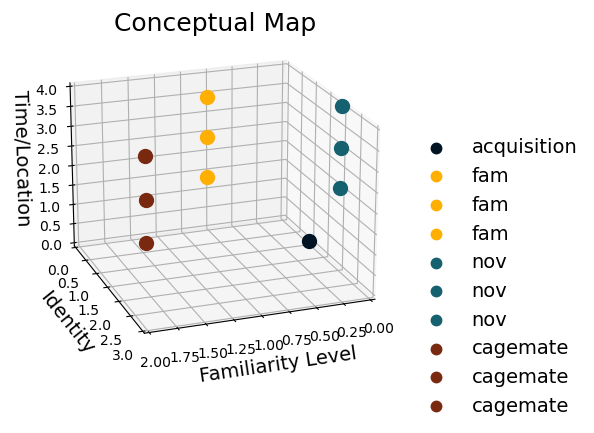

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
#familiarity x identity x time/location
acquisition = [0, 1, 0]

familiar_1 = [1, 1, 2]
familiar_2 = [1, 1, 3]
familiar_3 = [1, 1, 4]

novel_1 = [0, 2, 2] 
novel_2 = [0, 2, 3] 
novel_3 = [0, 2, 4] 

cagemate_1 = [2, 3, 2]
cagemate_2 = [2, 3, 3]
cagemate_3 = [2, 3, 4]
points = [acquisition, familiar_1, familiar_2, familiar_3, novel_1, novel_2, novel_3, cagemate_1, cagemate_2, cagemate_3]
labels = ['acquisition', 'fam', 'fam', 'fam', 'nov', 'nov', 'nov', 'cagemate', 'cagemate', 'cagemate']
color_fam = {'cagemate': hex_2_rgb('#792910'), 'fam': (1.0, 0.6862745098039216, 0.0), 
             'nov': hex_2_rgb('#15616F'), 'acquisition': hex_2_rgb('#001424')}
for point in range(len(points)):
    ax.scatter(points[point][0], points[point][1], points[point][2], label= labels[point], color = color_fam[labels[point]], s=100)
ax.legend(loc="upper left", bbox_to_anchor=(1, .70), frameon = False, fontsize = 14, markerscale = .75)
ax.set_xlabel("Familiarity Level", fontsize = 14)
ax.set_ylabel("Identity", fontsize = 14)
ax.set_zlabel("Time/Location", fontsize = 14)
ax.view_init(azim = 70, elev = 20
    )
ax.set_xlim(0, 2)
ax.set_ylim(0, 3)
ax.set_zlim(0, 4)
plt.title('Conceptual Map', fontsize = 18, y = 1, x = .5)
plt.show()

In [ ]:

glm = {}
glm_shuffle = {}
rf = {}
rf_shuffle = {}
for key in auc_8session.keys():
    glm[key] =auc_8session[key]['glm']
    rf[key] =auc_8session[key]['rf']
    glm_shuffle_temp = []
    rf_shuffle_temp = []
    for i in range(5):
        glm_shuffle_temp.append(auc[key]['glm_shuffle'][i])
        rf_shuffle_temp.append(auc[key]['rf_shuffle'][i])
    glm_shuffle[key] = np.array(glm_shuffle_temp).reshape(25,100)
    rf_shuffle[key] = np.array(rf_shuffle_temp).reshape(25,100)
model_dict = {'Generalized Linear Model':glm, 'Random Forest Classifier':rf,
              'Generalized Linear Model\nSHUFFLED':glm_shuffle, 
              'Random Forest Classifier\nSHUFFLED':rf_shuffle}
pre_window = 5
equalize = 5
avg_auc = {}
no_plots = len(model_dict.keys())
height_fig = math.ceil(no_plots/2)
i = 1
alpha = 0.1
plt.figure(figsize=(10,4*height_fig))
plt.figure(figsize=(10,4))
for key in ['Generalized Linear Model', 'Random Forest Classifier']:
    novel_avg = np.mean(model_dict[key]['novel'], axis = 0)
    novel_sem = sem(model_dict[key]['novel'], axis = 0)
    x =np.linspace(-pre_window, equalize, len(novel_avg))
    cagemate_avg = np.mean(model_dict[key]['cagemate'], axis = 0)
    cagemate_sem = sem(model_dict[key]['cagemate'], axis = 0)
    familiar_avg = np.mean(model_dict[key]['recall'], axis = 0)
    familiar_sem = sem(model_dict[key]['recall'], axis = 0)
    if key == 'Generalized Linear Model':
        shuffle_key = 'Generalized Linear Model\nSHUFFLED'
    else:
        shuffle_key = 'Random Forest Classifier\nSHUFFLED'
    novelshuf_avg = np.mean(model_dict[shuffle_key]['novel'], axis = 0)
    novelshuf_sem = sem(model_dict[shuffle_key]['novel'], axis = 0)
    x =np.linspace(-pre_window, equalize, len(novelshuf_avg))
    cagemateshuf_avg = np.mean(model_dict[shuffle_key]['cagemate'], axis = 0)
    cagemateshuf_sem = sem(model_dict[shuffle_key]['cagemate'], axis = 0)
    familiarshuf_avg = np.mean(model_dict[shuffle_key]['recall'], axis = 0)
    familiarshuf_sem = sem(model_dict[shuffle_key]['recall'], axis = 0)
    plt.subplot(1,2,i)
    plt.plot(x, novel_avg, label ='novel', color=hex_2_rgb('#15616F'))
    plt.fill_between(x, novel_avg-novel_sem, novel_avg+novel_sem,color=hex_2_rgb('#15616F'), alpha= alpha)
    plt.plot(x, familiar_avg, label = 'familiar', color = (1.0, 0.6862745098039216, 0.0))
    plt.fill_between(x, familiar_avg-familiar_sem, familiar_avg+familiar_sem, color = (1.0, 0.6862745098039216, 0.0), alpha = alpha)
    plt.plot(x, cagemate_avg, label = 'cagemate', color=hex_2_rgb('#792910'))
    plt.fill_between(x, cagemate_avg-cagemate_sem, cagemate_avg+cagemate_sem,color=hex_2_rgb('#792910'), alpha = alpha)
    plt.plot(x, novelshuf_avg, label ='novel shuffled',  linestyle='--', color=hex_2_rgb('#15616F'))
    plt.fill_between(x, novelshuf_avg-novelshuf_sem, novelshuf_avg+novelshuf_sem,color=hex_2_rgb('#15616F'), alpha= alpha)
    plt.plot(x, familiarshuf_avg, label = 'familiar shuffled', linestyle='--',  color = (1.0, 0.6862745098039216, 0.0))
    plt.fill_between(x, familiarshuf_avg-familiarshuf_sem, familiarshuf_avg+familiarshuf_sem, color = (1.0, 0.6862745098039216, 0.0), alpha = alpha)
    plt.plot(x, cagemateshuf_avg, label = 'cagemate shuffled',  linestyle='--', color=hex_2_rgb('#792910'))
    plt.fill_between(x, cagemateshuf_avg-cagemateshuf_sem, cagemateshuf_avg+cagemateshuf_sem, color=hex_2_rgb('#792910'), alpha = alpha)
    plt.title(f'{key}', fontsize = 16)
    plt.ylim(.4, 1)
    plt.xlim(-5,5)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Time to investigation onset', fontsize=14)
    plt.ylabel('Area Under the Curve Score', fontsize=14)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if i ==2:
        plt.legend(bbox_to_anchor = (1.07,.75), frameon=False)
    i += 1
plt.suptitle('8 sessions for real', fontsize = 20, font = 'Arial', x = .6, y = 1.1)
plt.subplots_adjust(wspace=0.3)
plt.show()


NameError: name 'auc_8session' is not defined

In [ ]:
minus_1pc_auc = trial_decoder(equalize = 5, pre_window = 5, post_window = 0,num_fold=5, num_shuffle=5, no_PCs= 8, events = ['novel', 'recall','cagemate'])

NameError: name 'trial_decoder' is not defined

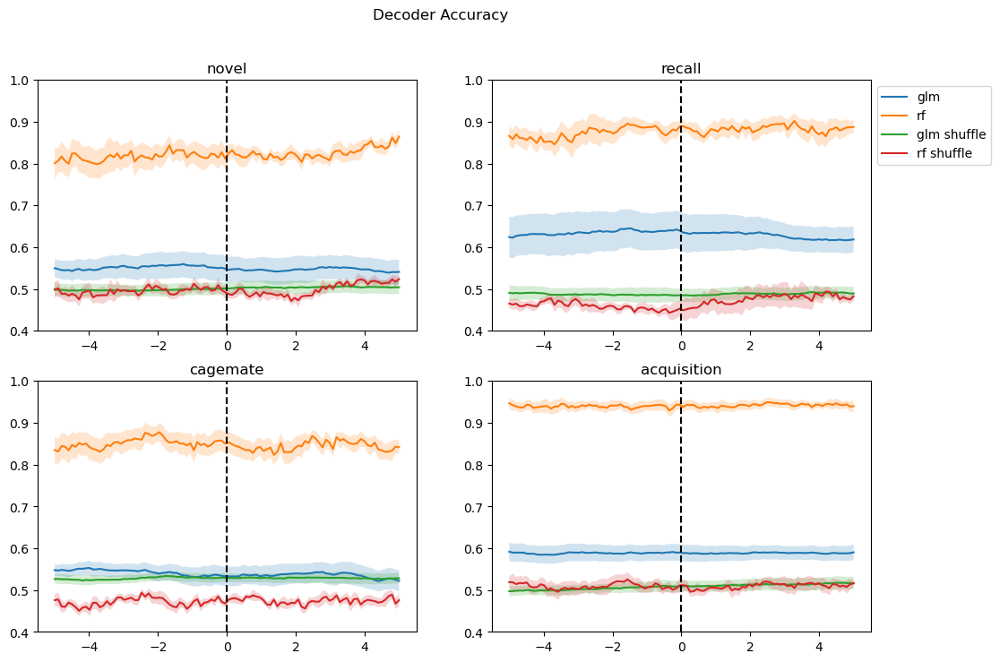

In [ ]:
minus_1pc_auc = trial_decoder(equalize = 5, pre_window = 5, post_window = 0,num_fold=5, num_shuffle=5, no_PCs= 8, events = ['novel', 'recall','cagemate', 'acquisition'])

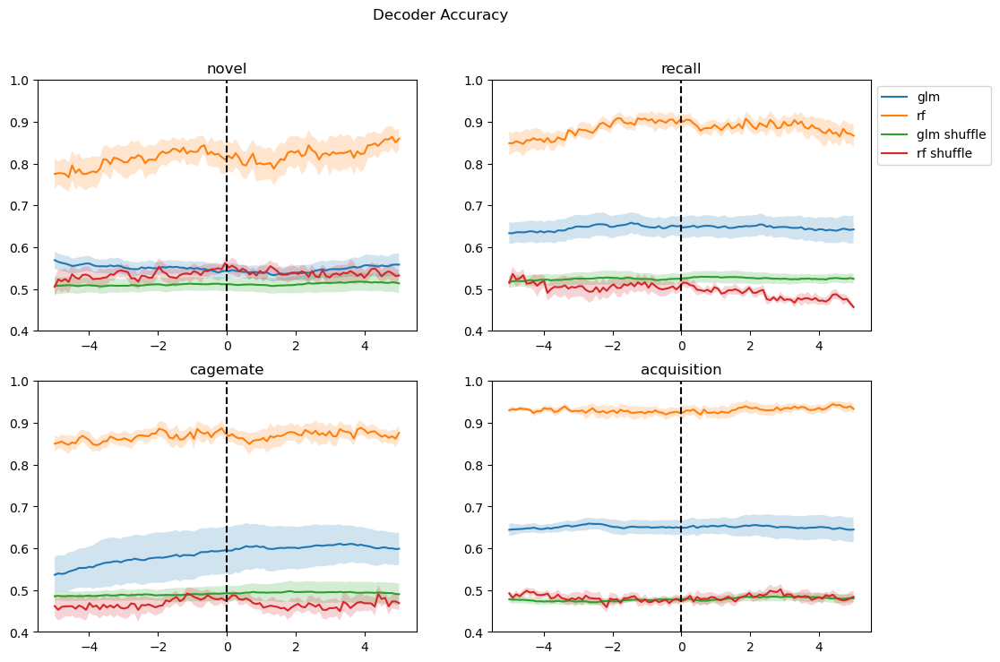

In [ ]:
allconditions_auc = phase2_analysis.trial_decoder(equalize = 5, pre_window = 5, post_window = 0,num_fold=5, num_shuffle=5, no_PCs= 8, events = ['novel', 'recall','cagemate', 'acquisition'])

### Time decoder functions



In [ ]:
phase2_collection.collection.keys()

FCN = ['20230803_101331_1_merged.rec', 
'20230804_121600_1_merged.rec', 
'20230817_113746_1_merged.rec']

CNF = ['20230817_100823_1_merged.rec',
'20230803_141047_1_merged.rec',
'20230818_133620_1_merged.rec']

NFC = ['20230818_115728_1_merged.rec',
'20230804_141009_1_merged.rec',
'20230803_121318_1_merged.rec']


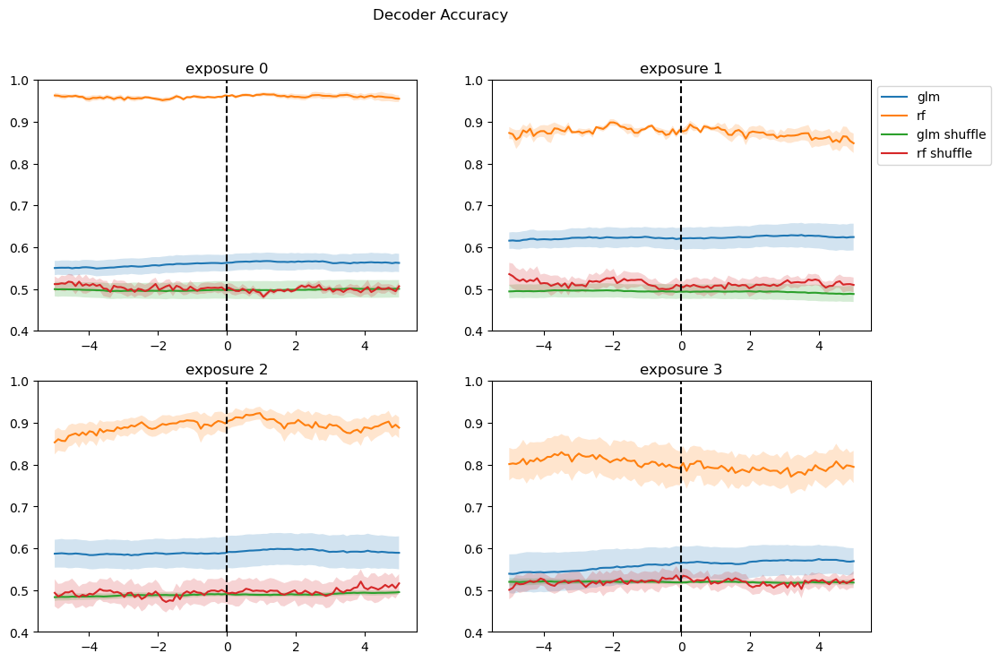

In [ ]:
time_auc = phase2_analysis.trial_decoder(equalize = 5,
                                        pre_window = 5,
                                        post_window = 0,
                                        num_fold = 5,
                                        num_shuffle = 5,
                                        no_PCs = 8,
                                        events = ['exposure 0', 'exposure 1', 'exposure 2', 'exposure 3'],
                                        plot = True)

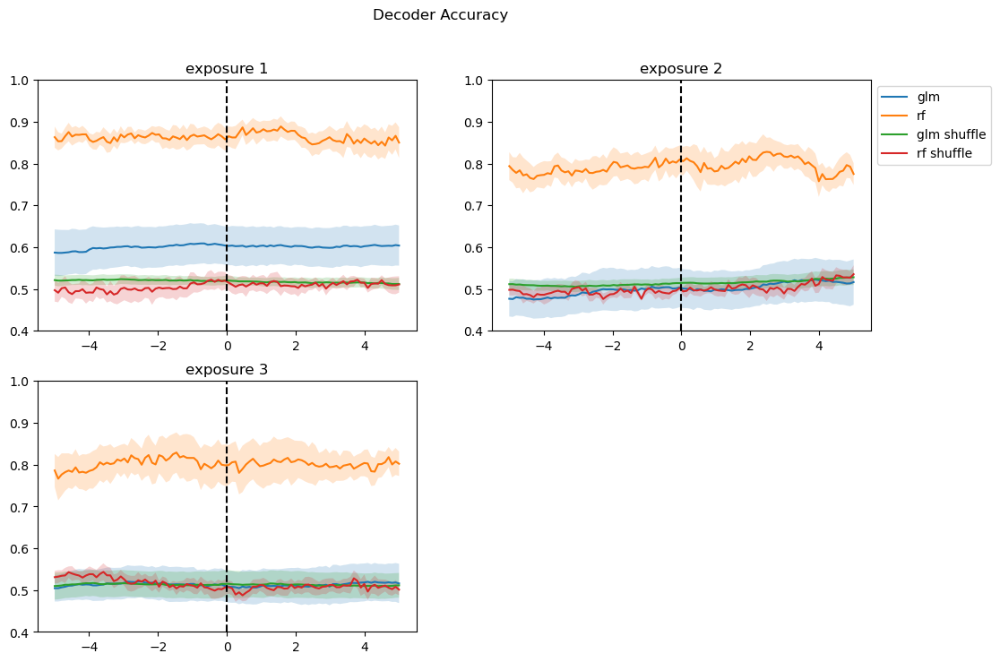

In [ ]:
[time_auc, time_prob] = phase2_analysis.trial_decoder(equalize = 5,
                                        pre_window = 5,
                                        post_window = 0,
                                        num_fold = 5,
                                        num_shuffle = 5,
                                        no_PCs = 8,
                                        events = ['exposure 1', 'exposure 2', 'exposure 3'],
                                        plot = True)

In [ ]:
with open('identity_auc_phase2.pkl', 'rb') as file:
    identity_auc_phase2_auc = pickle.load(file)

with open('refined_auc_phase2.pkl', 'rb') as file:
    refined_auc_phase2 = pickle.load(file)

In [ ]:

combined_dict = {**time_auc_no_acq, **refined_auc_phase2}
combined_dict.keys()

### Probability Plotting 

In [10]:
def __PCA_for_decoding_tagged_(equalize, pre_window, post_window, no_PCs, events, counter_events = None):
        full_PCA_matrix, t_df, key, coefficients, explained_variance_ratios = phase2_analysis.PCA_matrix_generation(equalize, pre_window, post_window, events = events)
        print(explained_variance_ratios[0:10])
        recordings = full_PCA_matrix.columns.to_list()
        recording_list = np.unique(recordings)
        coefficients = coefficients[:, :no_PCs]
        recording_indices = get_indices(recordings)
        decoder_data = []
        if counter_events is not None:
            for event in counter_events:
                if event not in events:
                    events.append(event)
        #decoder data dict: events for keys, values is a list of len(events)
        #each element in the list is the transformed matrix
        for recording in recording_list:
            #iterate through recording
            start = recording_indices[recording][0]
            stop = recording_indices[recording][1]
            #trim weight matrix for only those neurons in the current recording
            subset_coeff = coefficients[start:stop+1, :]
            recording_instance = phase2_analysis.ephyscollection.get_by_name(recording)
            recording_data = {}
            for event in events:
                #grab all event firing rates for current event in current recording
                event_firing_rates = phase2_analysis.__get_event_firing_rates__(recording_instance, event,
                                                                equalize, pre_window, post_window)
                for trial in range(len(event_firing_rates)):
                    #iterate through each event
                    trial_data = np.transpose(event_firing_rates[trial])
                    #transpoe event firing rates from neurons x timebins to timebins x neurons
                    transformed_trial = np.dot(trial_data, subset_coeff)
                    #transform each trial with original weight matrix
                    #T (timebins x pcs) = D (timebins x neurons). W (pcs x neurons) 

                    decoder_data.append([transformed_trial, event, recording_instance.order_dict[event]])
        return decoder_data 
 

 
def decode_id_w_time_labels(equalize, pre_window, post_window, num_fold, num_shuffle, no_PCs, events, plot = True):
    decoder_data = __PCA_for_decoding_tagged_(equalize, pre_window, post_window, no_PCs, events = events)
    #decoder data = list(timebins x pcs)
    T = (equalize + pre_window + post_window) * 1000 / phase2_analysis.timebin
    auc = {}
    prob = {}
    for event in events:
        data_neg = []
        data_pos = []
        pos_time_labels = []
        neg_time_labels = []
        neg_events = np.setdiff1d(events, event)
        for trial in decoder_data:
            if trial[1] == event:
                data_pos.append(trial[0])
                pos_time_labels.append(trial[2])
            if trial[1] in neg_events:
                data_neg.append(trial[0])
                neg_time_labels.append(trial[2])
        data_pos = np.stack(data_pos, axis=2)
        data_neg = np.stack(data_neg, axis=2)
        neg_time_labels = np.array(neg_time_labels)
        pos_time_labels = np.array(pos_time_labels)
        num_pos = data_pos.shape[2]
        num_neg = data_neg.shape[2]
        shuffle_pos = np.random.permutation(num_pos)
        shuffle_neg = np.random.permutation(num_neg)
        new_pos_labels = pos_time_labels[shuffle_pos]
        new_neg_labels = neg_time_labels[shuffle_neg]
        data_pos = data_pos[:, :, shuffle_pos]
        data_neg = data_neg[:, :, shuffle_neg]
        auc[event] = {'glm': [], 'rf': [],
                        'glm_shuffle': [], 'rf_shuffle': []}
        prob[event] = {'glm': [], 'rf': [], 
                        'glm_shuffle': [], 'rf_shuffle': [], 'time labels': [], 'id labels': []}
        for fold in range(num_fold):
            auc_glm = []
            auc_rf = []
            auc_glm_shuffle = []
            auc_rf_shuffle = []
            prob_glm = []
            prob_rf = []
            prob_glm_shuffle = []
            prob_rf_shuffle = []
            pos_fold = num_pos // num_fold
            neg_fold = num_neg // num_fold
            data_test = np.concatenate((data_pos[:, :, fold * pos_fold:(fold + 1) * pos_fold],
                                        data_neg[:, :, fold * neg_fold:(fold + 1) * neg_fold]), axis=2)
            label_test = np.concatenate((np.ones((fold + 1) * pos_fold - fold * pos_fold),
                                        np.zeros((fold + 1) * neg_fold - fold * neg_fold)))
            label_time = np.concatenate(
                [new_pos_labels[fold * pos_fold:(fold + 1) * pos_fold],
                new_neg_labels[fold * neg_fold:(fold + 1) * neg_fold]])
            data_train = np.concatenate((
                data_pos[:, :, np.setdiff1d(np.arange(num_pos), 
                np.arange(fold * pos_fold, (fold + 1) * pos_fold))],
                data_neg[:, :, np.setdiff1d(np.arange(num_neg), 
                np.arange(fold * neg_fold, (fold + 1) * neg_fold))]),
                axis=2)
            label_train = np.concatenate((np.ones(num_pos - (fold + 1) * pos_fold + fold * pos_fold),
                                        np.zeros(num_neg - (fold + 1) * neg_fold + fold * neg_fold)))
            for timebin in range(int(T)):
                model_glm = LogisticRegression(class_weight='balanced')
                model_glm.fit(data_train[timebin, :, :].T, label_train)
                pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                prob_glm.append(pred_glm[:,1])
                auc_glm.append(roc_auc_score(label_test, pred_glm[:, 1]))
                auc_test = roc_auc_score(label_test, pred_glm[:, 1])
        
                model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                model_rf.fit(data_train[timebin, :, :].T, label_train)
                pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                prob_rf.append(pred_rf[:,1])
                auc_rf.append(roc_auc_score(label_test, pred_rf[:, 1]))
            auc[event]['glm'].append(auc_glm)
            auc[event]['rf'].append(auc_rf)
            prob[event]['glm'].append(prob_glm)
            prob[event]['rf'].append(prob_rf)
            prob[event]['time labels'].append(label_time)
            prob[event]['id labels'].append(label_test)
            for shuffle in range(num_shuffle):
                temp_glm_shuffle = []
                temp_rf_shuffle = []
                temp_prob_glm_shuffle = []
                temp_prob_rf_shuffle = [] 
                label_train = np.random.permutation(label_train)
                for timebin in range(int(T)):
                    model_glm = LogisticRegression(class_weight='balanced')
                    model_glm.fit(data_train[timebin, :, :].T, label_train)
                    pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                    temp_prob_glm_shuffle.append(pred_glm[:,1])
                    temp_glm_shuffle.append(roc_auc_score(label_test, pred_glm[:, 1]))

                    model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                    model_rf.fit(data_train[timebin, :, :].T, label_train)
                    pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                    temp_prob_rf_shuffle.append(pred_rf[:,1])
                    temp_rf_shuffle.append(roc_auc_score(label_test, pred_rf[:, 1]))
                auc_glm_shuffle.append(temp_glm_shuffle)
                auc_rf_shuffle.append(temp_rf_shuffle)
                prob_glm_shuffle.append(temp_prob_glm_shuffle)
                prob_rf_shuffle.append(temp_prob_rf_shuffle)
            auc[event]['glm_shuffle'].append(auc_glm_shuffle)
            auc[event]['rf_shuffle'].append(auc_rf_shuffle)
            prob[event]['glm_shuffle'].append(prob_glm_shuffle)
            prob[event]['rf_shuffle'].append(prob_rf_shuffle)
    if plot:
        phase2_analysis.__plot_auc__(auc, equalize, pre_window)
    for events in prob.values():
        for model, data in events.items():
            data = np.array(data)
            events[model] = data
    for events in auc.values():
        for model, data in events.items():
            events[model] = np.array(data)
    return [auc, prob]


 



[5.61891424e-01 4.01741723e-01 1.75522427e-02 1.07946788e-02
 3.98532269e-03 9.69182013e-04 7.43304353e-04 4.97385365e-04
 3.63424927e-04 2.76649148e-04]


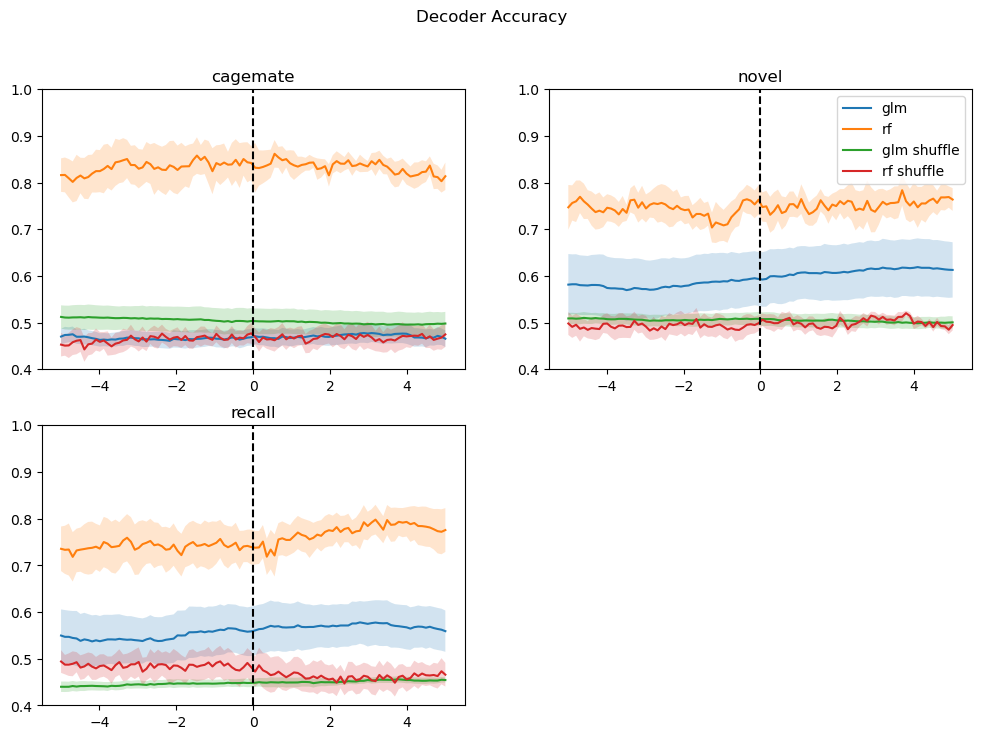

In [ ]:
[auc,prob] = decode_id_w_time_labels(equalize = 5,
                                    pre_window = 5,
                                    post_window = 0,
                                    num_fold = 5,
                                    num_shuffle = 5,
                                    no_PCs = 4, 
                                    events = ['cagemate', 'novel', 'recall'],
                                    plot = True)
                                

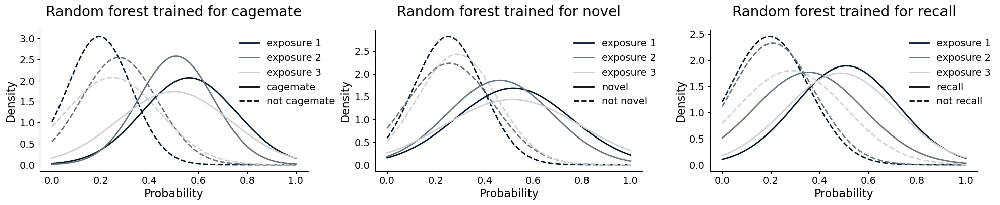

In [ ]:
from scipy.stats import norm
prob_dict = prob
avg_prob = {}
no_plots = len(prob_dict.keys())
height_fig = math.ceil(no_plots/2)
i = 1
color_dict = {'exposure 1': hex_2_rgb('#001424'), 'exposure 2': hex_2_rgb('#66727c'), 'exposure 3': hex_2_rgb('#ccd0d3')}
line_dict = {'positive': '-', 'negative':'--'}
plt.figure(figsize=(24,4*height_fig))
for key in prob_dict.keys():
    plt.subplot(height_fig,3,i)
    #average across timebins
    glm_avg = np.mean(prob_dict[key]['glm'], axis = 1)
    #flatten across folds
    glm_avg = glm_avg.flatten()
    rf_avg = np.mean(prob_dict[key]['rf'], axis = 1)
    rf_avg = rf_avg.flatten()
    glm_shuffle_avg = np.mean(np.mean(prob_dict[key]['glm_shuffle'], axis = 1), axis = 1)
    glm_shuffle_avg = glm_shuffle_avg.flatten()
    rf_shuffle_avg = np.mean(np.mean(prob_dict[key]['rf_shuffle'], axis = 1), axis = 1)
    rf_shuffle_avg = rf_shuffle_avg.flatten()
    labels = prob_dict[key]['time labels'].flatten()
    id_labels = prob_dict[key]['id labels'].flatten()
    for id_type in np.unique(id_labels):
        line_dict = {f'{key}': '-', f'not {key}':'--'}
        id_mask = (id_labels == id_type)
        labels_temp = labels[id_mask]
        rf_avg_temp = rf_avg[id_mask]
        for label in np.unique(labels):
            if id_type == 0.0:
                id_label = f'Not {key}'
                edgecolor_id = 'black'
                id_linetype = '--'
            else:
                id_label = f'{key}'
                edgecolor_id = 'red'
                id_linetype = '-'
            time_mask = (labels_temp == label)
            rf_avg_temp_temp = rf_avg_temp[time_mask]
            x = np.linspace(0, 1, 100)
            p = norm.pdf(x, np.mean(rf_avg_temp_temp), np.std(rf_avg_temp_temp))
            #plt.hist(rf_avg_temp_temp, bins=30, density=True, edgecolor=edgecolor_id, alpha=0.7, label = f'{id_label}, {label}', color = color_dict[label])
            plt.plot(x, p, linewidth=2, linestyle = id_linetype, color = color_dict[label])
            exposure_labels = [plt.Line2D([0], [0], color=color_dict[label], lw=2, label=label) for label in color_dict]
            time_labels = [plt.Line2D([0], [0], linestyle=line_dict[label], color = 'k', lw=2, label=label) for label in line_dict]
            legend_labels = exposure_labels + time_labels
            plt.legend(handles=legend_labels, frameon= False, fontsize = 14, bbox_to_anchor=(.71, 1))
            plt.xlabel('Probability', fontsize = 16)
            plt.ylabel('Density', fontsize = 16)
            plt.gca().spines['top'].set_visible(False)
            plt.gca().spines['right'].set_visible(False)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
    plt.title(f'Random forest trained for {key}',fontsize = 20, y = 1.07)
    i +=1
plt.subplots_adjust(wspace=0.25)
plt.show()

In [ ]:
exp_pca_df, coeff, var = phase2_analysis.PCA_trajectories(equalize = 5,
                                    pre_window = 5,
                                    post_window = 0,
                                    events  = ['exposure 1', 'exposure 2', 'exposure 3'],
                                    plot = False)
total_variance = 0 
for variance in var[0:10]:
    total_variance =+ total_variance + variance
    print(total_variance)

0.8350999786988652
0.9758098880293855
0.9825256414840722
0.9888587821196716
0.9922846286427331
0.99463593308589
0.995884327188512
0.9967845154929118
0.9974975867822595
0.9981036031680955


[5.58685575e-01 4.02056380e-01 2.02016740e-02 1.01753713e-02
 4.90018546e-03 9.49459160e-04 7.18983410e-04 5.08383240e-04
 2.88947053e-04 2.62276667e-04]
247
exposure 1 ['exposure 2' 'exposure 3']
exposure 2 ['exposure 1' 'exposure 3']
exposure 3 ['exposure 1' 'exposure 2']


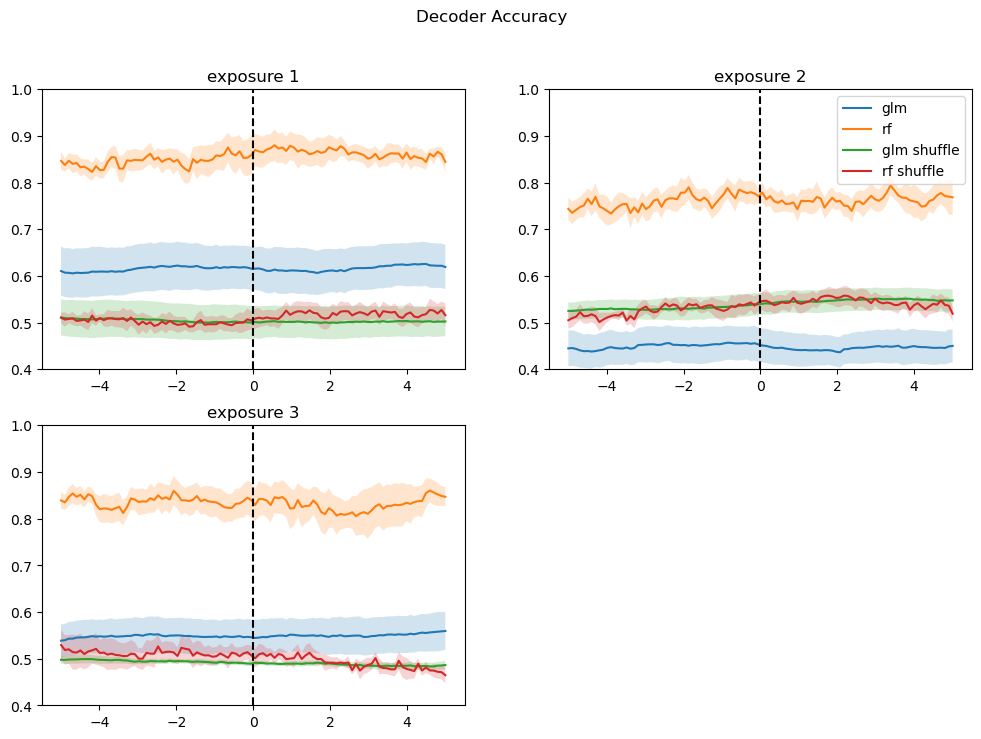

In [ ]:
[auc_time,prob_time] = decode_id_w_id_labels(equalize = 5,
                                    pre_window = 5,
                                    post_window = 0,
                                    num_fold = 5,
                                    num_shuffle = 5,
                                    no_PCs = 8, 
                                    events = ['exposure 1', 'exposure 2', 'exposure 3'],
                                    plot = True)


[8.35099979e-01 1.40709909e-01 6.71575345e-03 6.33314064e-03
 3.42584652e-03 2.35130444e-03 1.24839410e-03 9.00188304e-04
 7.13071289e-04 6.06016386e-04]
247
exposure 1 ['exposure 2' 'exposure 3']
exposure 2 ['exposure 1' 'exposure 3']
exposure 3 ['exposure 1' 'exposure 2']


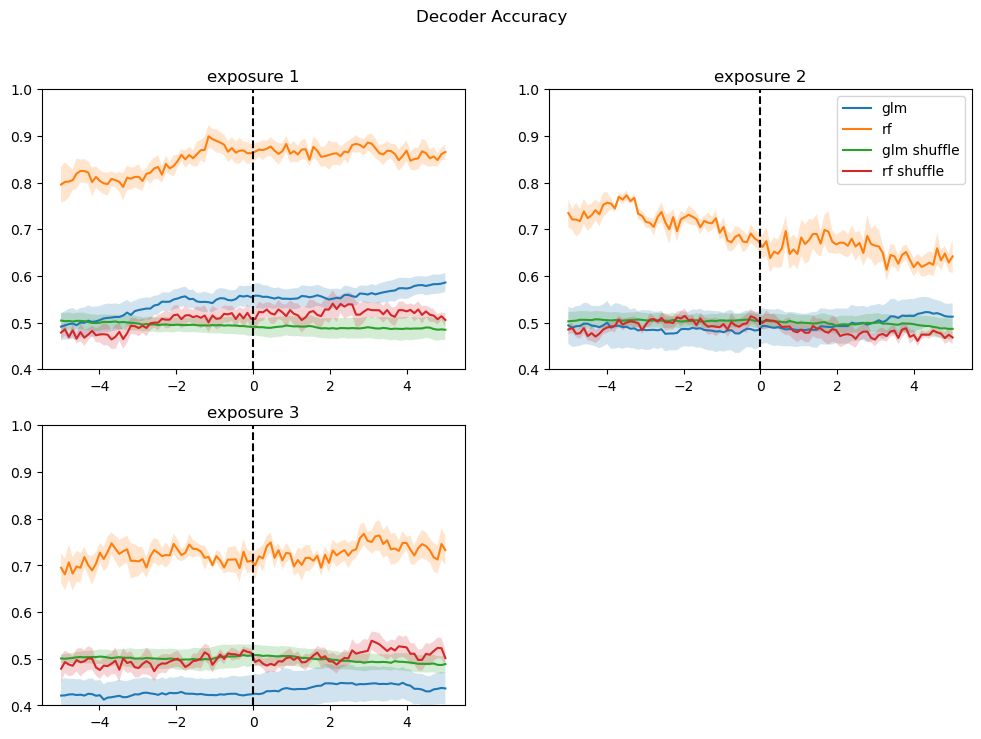

In [ ]:
[auc_time_5,prob_time_5] = decode_id_w_id_labels(equalize = 5,
                                    pre_window = 5,
                                    post_window = 0,
                                    num_fold = 5,
                                    num_shuffle = 5,
                                    no_PCs = 5, 
                                    events = ['exposure 1', 'exposure 2', 'exposure 3'],
                                    plot = True)

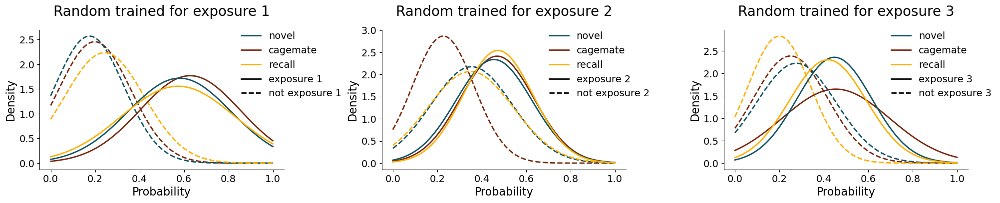

In [ ]:
from scipy.stats import norm
prob_dict = prob_time_5
avg_prob = {}
no_plots = len(prob_dict.keys())
height_fig = math.ceil(no_plots/2)
i = 1
color_dict = {'novel': hex_2_rgb('#115566'), 'cagemate': hex_2_rgb('#792910') , 'recall': hex_2_rgb('#FFAF00')}
spacing = [.79,.65,.65]
plt.figure(figsize=(24,4*height_fig))
for key in prob_dict.keys():
    plt.subplot(height_fig,3,i)
    #average across timebins
    glm_avg = prob_dict[key]['glm'][:,99,:]
    #flatten across folds
    glm_avg = glm_avg.flatten()
    rf_avg = np.mean(prob_dict[key]['rf'], axis = 1)
    rf_avg = rf_avg.flatten()
    glm_shuffle_avg = np.mean(np.mean(prob_dict[key]['glm_shuffle'], axis = 1), axis = 1)
    glm_shuffle_avg = glm_shuffle_avg.flatten()
    rf_shuffle_avg = np.mean(np.mean(prob_dict[key]['rf_shuffle'], axis = 1), axis = 1)
    rf_shuffle_avg = rf_shuffle_avg.flatten()
    labels = prob_dict[key]['id labels'].flatten()
    id_labels = prob_dict[key]['time labels'].flatten()
    for id_type in np.unique(id_labels):
        id_mask = (id_labels == id_type)
        labels_temp = labels[id_mask]
        rf_avg_temp = rf_avg[id_mask]
        for label in np.unique(labels):
            line_dict = {f'{key}': '-', f'not {key}':'--'}
            if id_type == 0.0:
                id_label = f'Not {key}'
                edgecolor_id = 'black'
                id_linetype = '--'
            else:
                id_label = f'{key}'
                edgecolor_id = 'red'
                id_linetype = '-'
            time_mask = (labels_temp == label)
            rf_avg_temp_temp = rf_avg_temp[time_mask]
            x = np.linspace(0, 1, 100)
            p = norm.pdf(x, np.mean(rf_avg_temp_temp), np.std(rf_avg_temp_temp))
            #plt.hist(rf_avg_temp_temp, bins=30, density=True, edgecolor=edgecolor_id, alpha=0.7, label = f'{id_label}, {label}', color = color_dict[label])
            plt.plot(x, p, linewidth=2, linestyle = id_linetype, color = color_dict[label])
            exposure_labels = [plt.Line2D([0], [0], color=color_dict[label], lw=2, label=label) for label in color_dict]
            time_labels = [plt.Line2D([0], [0], linestyle=line_dict[label], color = 'k', lw=2, label=label) for label in line_dict]
            legend_labels = exposure_labels + time_labels
            plt.legend(handles=legend_labels, frameon= False, fontsize = 14, bbox_to_anchor=(spacing[i-1], 1.05))
            plt.xlabel('Probability', fontsize = 16)
            plt.ylabel('Density', fontsize = 16)
            plt.gca().spines['top'].set_visible(False)
            plt.gca().spines['right'].set_visible(False)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
    plt.title(f'Random trained for {key}', fontsize = 20, y = 1.07)
    i +=1
plt.subplots_adjust(wspace=0.4)
plt.show()

In [ ]:
sniffs = {'exposure 1': 0, 'exposure 2': 0, 'exposure 3': 0, 'cagemate': 0, 'recall': 0, 'novel': 0}
counts = {'exposure 1': [], 'exposure 2': [], 'exposure 3': [], 'cagemate': [], 'recall': [], 'novel': []}
for recording in phase2_collection.collection.values():
    for event, array in recording.event_dict.items():
        session_total = len(array)
        try:
            sniffs[event] = sniffs[event] + session_total
            counts[event].append(session_total)
        except KeyError:
            pass

print(sniffs)
print(counts)
    


{'exposure 1': 83, 'exposure 2': 88, 'exposure 3': 76, 'cagemate': 82, 'recall': 76, 'novel': 89}
{'exposure 1': [4, 8, 9, 11, 11, 16, 7, 6, 11], 'exposure 2': [6, 6, 9, 11, 8, 19, 11, 8, 10], 'exposure 3': [3, 5, 12, 7, 11, 14, 16, 2, 6], 'cagemate': [6, 5, 9, 11, 11, 16, 11, 2, 11], 'recall': [4, 6, 12, 11, 8, 14, 7, 8, 6], 'novel': [3, 8, 9, 7, 11, 19, 16, 6, 10]}


In [ ]:
all_3_larger_timebins[4][0].keys()
auc_id = all_3_larger_timebins[4][0]

All set to analyze


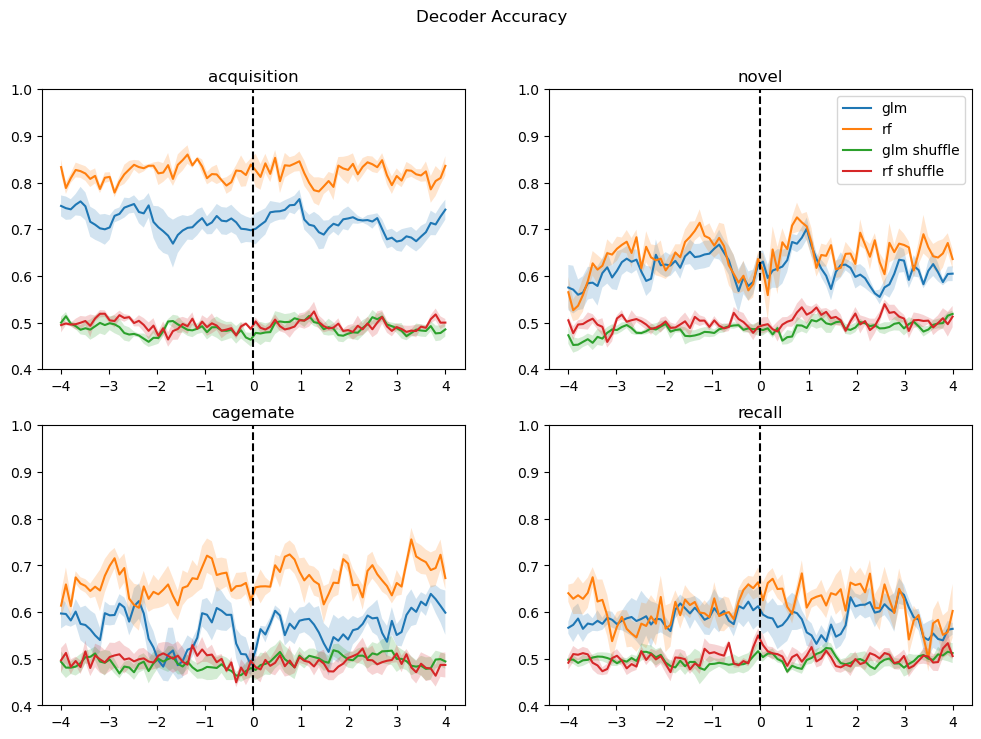

In [6]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 100,
                                                     ignore_freq=0.5,
                                                     smoothing_window = 500)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 4,
                                            pre_window = 4,
                                            post_window = 0,
                                            num_fold=5,
                                            num_shuffle=5,
                                            no_PCs= 17, 
                                            events = ['acquisition', 'novel', 'cagemate', 'recall'])

All set to analyze


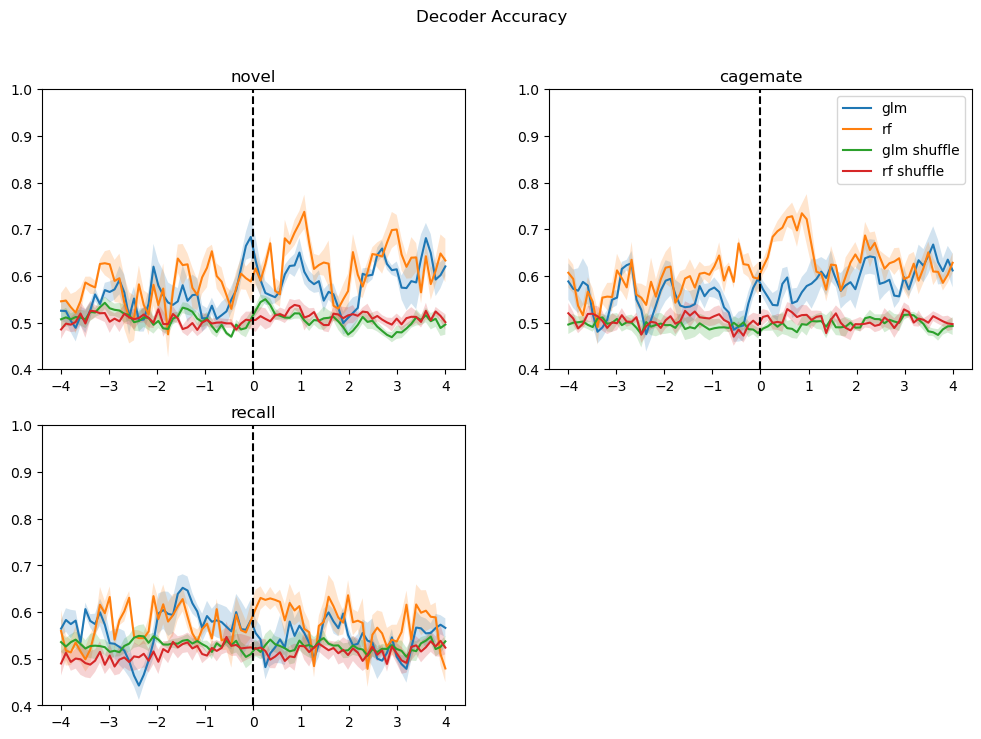

In [7]:
phase2_analysis = spike.SpikeAnalysis_MultiRecording(phase2_collection,
                                                     timebin = 100,
                                                     ignore_freq=0.5,
                                                     smoothing_window = 500)
[auc, prob] = phase2_analysis.trial_decoder(equalize = 4,
                                            pre_window = 4,
                                            post_window = 0,
                                            num_fold=5,
                                            num_shuffle=5,
                                            no_PCs= 20, 
                                            events = ['novel', 'cagemate', 'recall'])

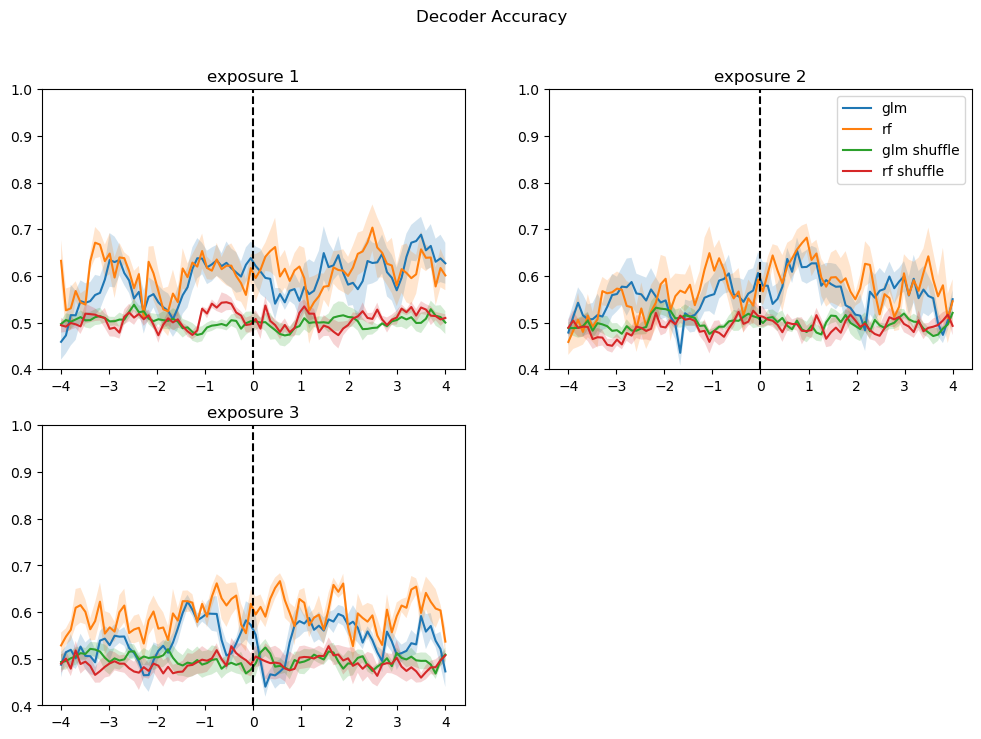

In [8]:

[auc_time, prob_time] = phase2_analysis.trial_decoder(equalize = 4,
                                            pre_window = 4,
                                            post_window = 0,
                                            num_fold=5,
                                            num_shuffle=5,
                                            no_PCs= 20, 
                                            events = ['exposure 1', 'exposure 2', 'exposure 3'])

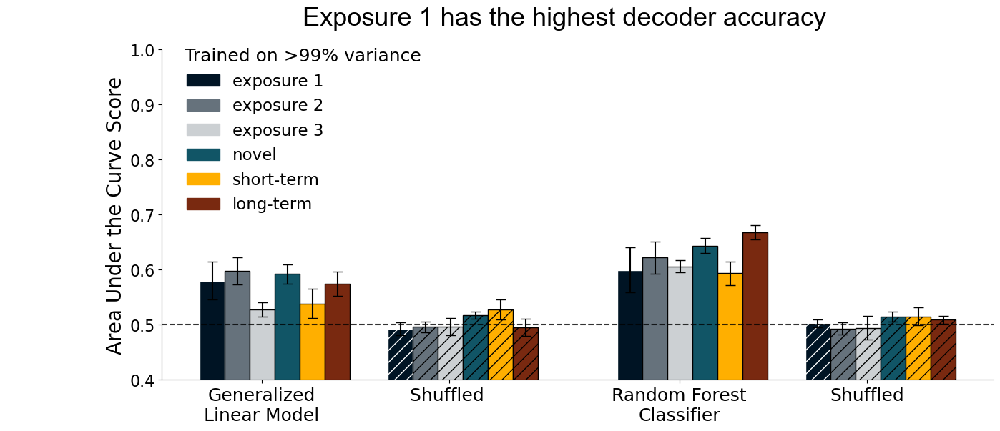

In [71]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
combined_dict = {**auc, **auc_time}
new_dict = collapsed_auc_dict(combined_dict, 0, 1.5, 100, 4)
pre_window = 5
equalize = 5
avg_auc = {}
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'recall', 'cagemate'] # Example categories
categories_for_legend = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'short-term', 'long-term']



avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.12  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(15, 6))
col = [hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3'), hex_2_rgb('#115566'), hex_2_rgb('#FFAF00'), hex_2_rgb('#792910') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black', 'black', 'black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
    hatches = ['','//','','//', '', '//', '', '//', '', '//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor=edge[i], alpha=alphas[j], label=category if i == 0 else '', color = col[i], hatch=hatches[j])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend
# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories_for_legend[i]) for i in range(len(col))]
# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 16.5, frameon= False, bbox_to_anchor=(0.42,1.05), 
title = '                                           Trained on >99% variance')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-105, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Exposure 1 has the highest decoder accuracy', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

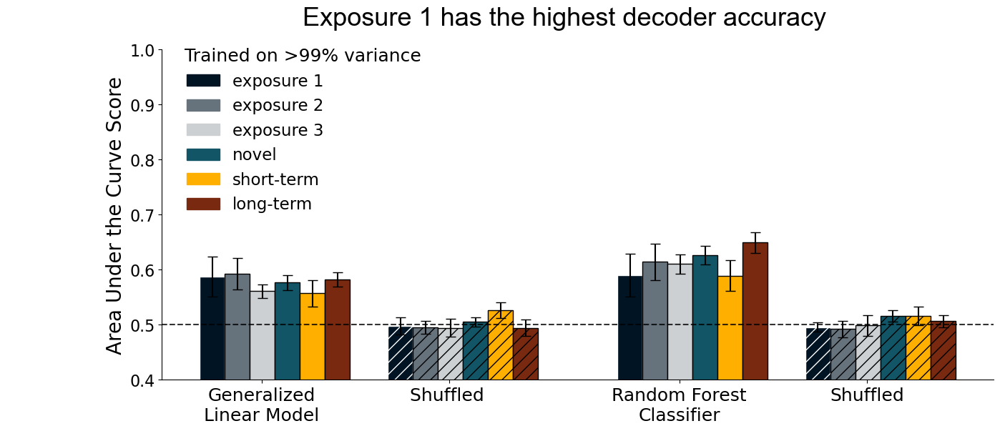

In [68]:
combined_dict = {**auc, **auc_time}
new_dict = collapsed_auc_dict(combined_dict, .5, 2, 100, 4)
pre_window = 5
equalize = 5
avg_auc = {}
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'recall', 'cagemate'] # Example categories
categories_for_legend = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'short-term', 'long-term']



avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.12  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(15, 6))
col = [hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3'), hex_2_rgb('#115566'), hex_2_rgb('#FFAF00'), hex_2_rgb('#792910') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black', 'black', 'black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
    hatches = ['','//','','//', '', '//', '', '//', '', '//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor=edge[i], alpha=alphas[j], label=category if i == 0 else '', color = col[i], hatch=hatches[j])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend
# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories_for_legend[i]) for i in range(len(col))]
# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 16.5, frameon= False, bbox_to_anchor=(0.42,1.05), 
title = '                                           Trained on >99% variance')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-105, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Exposure 1 has the highest decoder accuracy', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

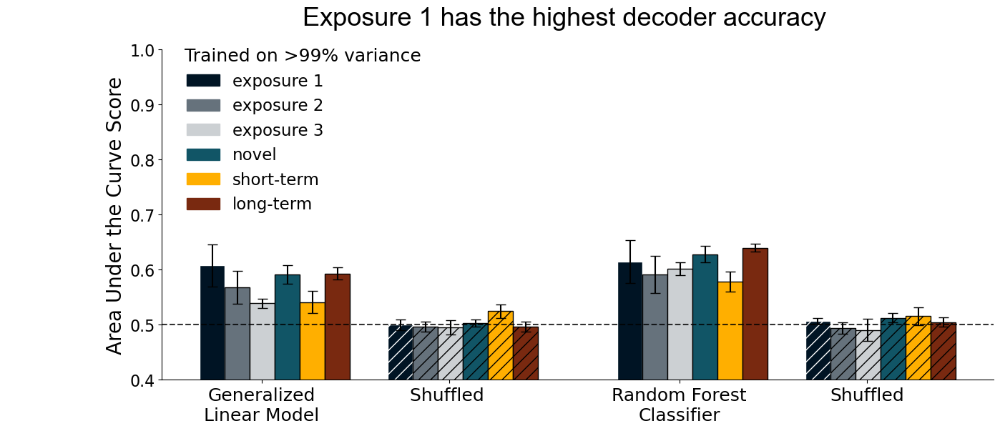

In [69]:
combined_dict = {**auc, **auc_time}
new_dict = collapsed_auc_dict(combined_dict, 0, 4, 100, 4)
pre_window = 5
equalize = 5
avg_auc = {}
i = 1
no_plots = len(new_dict.keys())
height_fig = no_plots//2
categories = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'recall', 'cagemate'] # Example categories
categories_for_legend = ['exposure 1', 'exposure 2', 'exposure 3', 'novel', 'short-term', 'long-term']



avg_values = {category: [] for category in categories}
sem_values = {category: [] for category in categories}
for key in new_dict.keys():
    for category in categories:
        avg_values[category].append(np.mean(new_dict[key][category], axis=0))
        sem_values[category].append(sem(new_dict[key][category], axis=0))

bar_width = 0.12  # Width of each bar
x = np.arange(len(list(new_dict.keys())))  # x-axis positions
legend_labels = {category: [] for category in categories}
plt.figure(figsize=(15, 6))
col = [hex_2_rgb('#001424'),hex_2_rgb('#66727c'), hex_2_rgb('#ccd0d3'), hex_2_rgb('#115566'), hex_2_rgb('#FFAF00'), hex_2_rgb('#792910') ]
spacing = [0, -0.1, 0 , -0.1]
edge = ['white', 'black','black', 'black', 'black', 'black', 'black']
for i, category in enumerate(categories):
    positions = x + (i -0.3) * bar_width  # Adjust positions for each category
    alphas = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
    hatches = ['','//','','//', '', '//', '', '//', '', '//']
    for j, pos in enumerate(positions):
        bar = plt.bar(pos + spacing[j], avg_values[category][j], width=bar_width, yerr=sem_values[category][j],
                capsize=5, edgecolor=edge[i], alpha=alphas[j], label=category if i == 0 else '', color = col[i], hatch=hatches[j])
plt.ylim(0.4, 1)
plt.yticks(fontsize=16)
for i, color in enumerate(col):
    plt.plot([], [], color=color, label=categories[i], linewidth=5)  # Empty plots to create the legend
# Create handles for the legend (rectangles as pseudo bars)
legend_patches = [mpatches.Patch(color=col[i], label=categories_for_legend[i]) for i in range(len(col))]
# Add the custom legend with rectangles as pseudo bars
legend = plt.legend(handles=legend_patches, fontsize = 16.5, frameon= False, bbox_to_anchor=(0.42,1.05), 
title = '                                           Trained on >99% variance')
legend.get_title().set_fontsize('18') 
legend.get_title().set_ha('left')
legend.get_title().set_position((-105, 1))
plt.xticks(x + spacing+0.2, new_dict.keys(), fontsize = 18)
plt.axhline(y=0.5, color='black', linestyle='--', alpha = 0.8)
plt.ylabel('Area Under the Curve Score', fontsize=20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.suptitle('Exposure 1 has the highest decoder accuracy', fontsize = 26, font = 'Arial')
plt.subplots_adjust(hspace=0.5)
plt.show()

In [72]:
ttests = {}
for key in new_dict.keys():
    order_order = []
    agent_order = []
    order_ps = []
    agent_ps = []
    order_stats = []
    agent_stats = []
    for pair in combinations(categories, 2):
        if ('exposure' in pair[0]) and ('exposure' in pair[1]):
            order_t_stat, order_p_value = mannwhitneyu(new_dict[key][pair[0]],new_dict[key][pair[1]])
            order_order.append(pair)
            order_ps.append(order_p_value)
            order_stats.append(order_t_stat)
        if ('exposure' not in pair[0]) and ('exposure' not in pair[1]):
            agent_t_stat, agent_p_value = mannwhitneyu(new_dict[key][pair[0]],new_dict[key][pair[1]])
            agent_order.append(pair)
            agent_ps.append(agent_p_value)
            agent_stats.append(agent_t_stat)
            print(pair)
    agent_adj_p = multipletests(agent_ps, alpha=0.05, method='holm')[1]
    order_adj_p = multipletests(order_ps, alpha=0.05, method='holm')[1]
    ttests[key] = {'agent': {'order':agent_order,
                             'stats': agent_stats,
                             'p value': agent_ps,
                             'adj p': agent_adj_p}, 
                   'order': {'order': order_order, 
                             'stats': order_stats, 
                             'p value': order_ps,
                             'adj p': order_adj_p}}

expanded_rows = []

# Iterate through the nested dictionary
for key, nested_dict in ttests.items():
    for subkey, metrics in nested_dict.items():
        # Get the length of the lists (assuming all lists are of equal length)
        list_length = len(metrics['order'])
        for i in range(list_length):
            row = {
                'key': key,
                'type': subkey,
                'order': metrics['order'][i],
                'stats': metrics['stats'][i],
                'p value': metrics['p value'][i],
                'adj p': metrics['adj p'][i]
            }
            expanded_rows.append(row)

# Create DataFrame from the expanded rows
df = pd.DataFrame(expanded_rows)

# Set MultiIndex
df = df.set_index(['key', 'type'])

df

('novel', 'recall')
('novel', 'cagemate')
('recall', 'cagemate')
('novel', 'recall')
('novel', 'cagemate')
('recall', 'cagemate')
('novel', 'recall')
('novel', 'cagemate')
('recall', 'cagemate')
('novel', 'recall')
('novel', 'cagemate')
('recall', 'cagemate')


order  stats   p value  \
key                       type                                               
Generalized\nLinear Model agent           (novel, recall)   21.0  0.095238   
                          agent         (novel, cagemate)   15.0  0.690476   
                          agent        (recall, cagemate)   10.0  0.690476   
                          order  (exposure 1, exposure 2)   12.0  1.000000   
                          order  (exposure 1, exposure 3)   18.0  0.309524   
                          order  (exposure 2, exposure 3)   21.0  0.095238   
Shuffled                  agent           (novel, recall)    9.0  0.547619   
                          agent         (novel, cagemate)   17.0  0.420635   
                          agent        (recall, cagemate)   19.0  0.222222   
                          order  (exposure 1, exposure 2)   11.0  0.841270   
                          order  (exposure 1, exposure 3)   11.0  0.841270   
                          order  (exposure 2, exposure 3)   11.0  0.841270   
Random Forest\nClassifier agent           (novel, recall)   21.0  0.095238   
                          agent         (novel, cagemate)    8.0  0.420635   
                          agent        (recall, cagemate)    2.0  0.031746   
                          order  (exposure 1, exposure 2)   11.0  0.841270   
                          order  (exposure 1, exposure 3)   13.0  1.000000   
                          order  (exposure 2, exposure 3)   16.0  0.547619   
Shuffled                  agent           (novel, recall)   11.0  0.841270   
                          agent         (novel, cagemate)   16.0  0.547619   
                          agent        (recall, cagemate)   16.0  0.547619   
                          order  (exposure 1, exposure 2)   17.0  0.420635   
                          order  (exposure 1, exposure 3)   15.0  0.690476   
                          order  (exposure 2, exposure 3)   12.0  1.000000   

                                    adj p  
key                       type             
Generalized\nLinear Model agent  0.285714  
                          agent  1.000000  
                          agent  1.000000  
                          order  1.000000  
                          order  0.619048  
                          order  0.285714  
Shuffled                  agent  0.841270  
                          agent  0.841270  
                          agent  0.666667  
                          order  1.000000  
                          order  1.000000  
                          order  1.000000  
Random Forest\nClassifier agent  0.190476  
                          agent  0.420635  
                          agent  0.095238  
                          order  1.000000  
                          order  1.000000  
                          order  1.000000  
Shuffled                  agent  1.000000  
                          agent  1.000000  
                          agent  1.000000  
                          order  1.000000  
                          order  1.000000  
                          order  1.000000

In [ ]:
# with open('time_auc.pkl','wb') as file:
#     pickle.dump(time_auc, file)

# with open('time_auc_no_acq.pkl','wb') as file:
#     pickle.dump(time_auc_no_acq, file)

In [ ]:
with open('time_auc.pkl', 'rb') as file:
    time_auc = pickle.load(file)

with open('time_auc_no_acq.pkl', 'rb') as file:
    time_auc_no_acq = pickle.load(file)

In [ ]:




def make_training_data(group_a, group_b, group_c, events, test_event, equalize, pre_window, post_window, no_PCs, num_fold, num_shuffle, plot=True):
    decoder_data = __PCA_for_decoding_tagged_(equalize, pre_window, post_window, no_PCs, events)
    ex_trial_matrix = decoder_data[group_a[0]][events[0]][0]
    T = ex_trial_matrix.shape[0]
    auc = {}  
    groups = ['group_a', 'group_b', 'group_c']
    group_dict = {'group_a': group_a, 'group_b': group_b, 'group_c':group_c}
    for group in groups:
        data_neg_test = []
        data_pos_test = []
        data_neg_train = []
        data_pos_train = []
        for recording in group_dict[group]:
            data = decoder_data[recording]
            for event in events:
                if event == test_event:
                    for trial in data[event]:
                        data_pos_test.append(trial)
                else:
                    for trial in data[event]:
                        data_neg_test.append(trial)
        data_pos_test = np.stack(data_pos_test, axis=2)
        data_neg_test = np.stack(data_neg_test, axis=2)
        num_pos_test = data_pos_test.shape[2]
        num_neg_test = data_neg_test.shape[2]
        for train_group in np.setdiff1d(groups, group):
            for recording in group_dict[train_group]:
                data = decoder_data[recording]
                for event in events:
                    if event == test_event:
                        for trial in data[event]:
                            data_pos_train.append(trial)
                    else:
                        for trial in data[event]:
                            data_neg_train.append(trial)
        data_pos_train = np.stack(data_pos_train, axis=2)
        data_neg_train = np.stack(data_neg_train, axis=2)
        num_pos_train = data_pos_train.shape[2]
        num_neg_train = data_neg_train.shape[2]
        print('training set:', num_neg_train, num_pos_train, num_neg_train/num_pos_train)
        print('testing set:', num_neg_test, num_pos_test, num_neg_test/num_pos_test)
        data_pos_train = data_pos_train[:, :, np.random.permutation(num_pos_train)]
        data_pos_test = data_pos_test[:, :, np.random.permutation(num_pos_test)]
        data_neg_train = data_neg_train[:, :, np.random.permutation(num_neg_train)]
        data_neg_test = data_neg_test[:, :, np.random.permutation(num_neg_test)]
        auc[group] = {'glm': [], 'rf': [], 'glm_shuffle': [], 'rf_shuffle': []}
        for fold in range(num_fold):
            auc_glm = []
            auc_rf = []
            auc_glm_shuffle = []
            auc_rf_shuffle = []
            pos_fold_test = num_pos_test // num_fold
            pos_fold_train = num_pos_train //num_fold
            neg_fold_train = num_neg_train // num_fold
            neg_fold_test = num_neg_test // num_fold
            data_test = np.concatenate((data_pos_test[:, :, fold * pos_fold_test:(fold + 1) * pos_fold_test],
                                        data_neg_test[:, :, fold * neg_fold_test:(fold + 1) * neg_fold_test]), axis=2)
            #here B is pos and c is neg
            label_test = np.concatenate((np.ones((fold + 1) * pos_fold_test - fold * pos_fold_test),
                                        np.zeros((fold + 1) * neg_fold_test - fold * neg_fold_test)))
            #so here i want A to be pos and b to neg  
            data_train = np.concatenate((
                data_pos_train[:, :, np.setdiff1d(np.arange(num_pos_train), 
                np.arange(fold * pos_fold_train, (fold + 1) * pos_fold_train))],
                data_neg_train[:, :, np.setdiff1d(np.arange(num_neg_train), 
                np.arange(fold * neg_fold_train, (fold + 1) * neg_fold_train))]),
                axis=2)
            label_train = np.concatenate((np.ones(num_pos_train - (fold + 1) * pos_fold_train + fold * pos_fold_train),
                                        np.zeros(num_neg_train - (fold + 1) * neg_fold_train + fold * neg_fold_train)))
            for timebin in range(T):
                model_glm = LogisticRegression(class_weight='balanced')
                model_glm.fit(data_train[timebin, :, :].T, label_train)
                pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                auc_glm.append(roc_auc_score(label_test, pred_glm[:, 1]))
                
                model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                model_rf.fit(data_train[timebin, :, :].T, label_train)
                pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                auc_rf.append(roc_auc_score(label_test, pred_rf[:, 1]))
            auc[group]['glm'].append(auc_glm)
            auc[group]['rf'].append(auc_rf)
            for shuffle in range(num_shuffle):
                temp_glm_shuffle = []
                temp_rf_shuffle = []
                label_train = np.random.permutation(label_train)
                for timebin in range(T):
                    model_glm = LogisticRegression(class_weight='balanced')
                    model_glm.fit(data_train[timebin, :, :].T, label_train)
                    pred_glm = model_glm.predict_proba(data_test[timebin, :, :].T)
                    temp_glm_shuffle.append(roc_auc_score(label_test, pred_glm[:, 1]))

                    model_rf = BaggingClassifier(estimator=DecisionTreeClassifier(class_weight = 'balanced'), n_estimators=50, random_state=0)
                    model_rf.fit(data_train[timebin, :, :].T, label_train)
                    pred_rf = model_rf.predict_proba(data_test[timebin, :, :].T)
                    temp_rf_shuffle.append(roc_auc_score(label_test, pred_rf[:, 1]))
                auc_glm_shuffle.append(temp_glm_shuffle)
                auc_rf_shuffle.append(temp_rf_shuffle)
            auc[group]['glm_shuffle'].append(auc_glm_shuffle)
            auc[group]['rf_shuffle'].append(auc_rf_shuffle)
    if plot:
        __plot_auc__(auc, equalize, pre_window)
    return auc
            



training set: 117 58 2.0172413793103448
testing set: 48 28 1.7142857142857142
training set: 95 50 1.9
testing set: 70 36 1.9444444444444444
training set: 118 64 1.84375
testing set: 47 22 2.1363636363636362


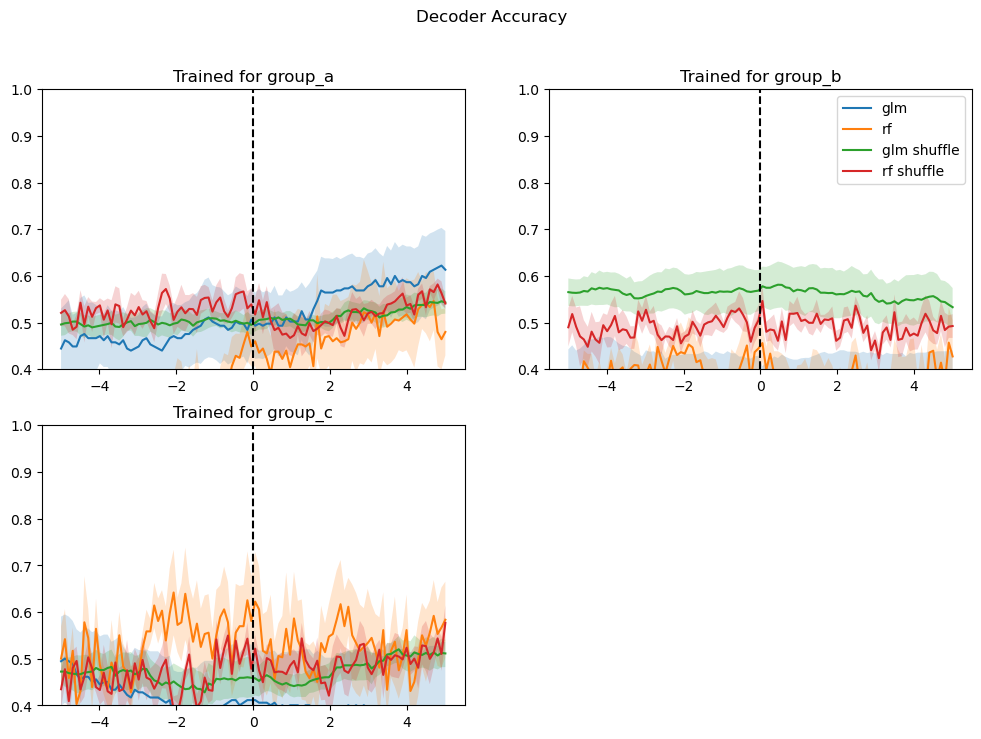

In [ ]:
tester = make_training_data(FCN, CNF, NFC, events = ['cagemate', 'novel', 'recall'], 
                            test_event = 'cagemate', equalize = 5, pre_window = 5, post_window = 0, no_PCs= 8, num_fold = 5, num_shuffle= 5)


training set: 116 59 1.9661016949152543
testing set: 50 26 1.9230769230769231
training set: 94 51 1.8431372549019607
testing set: 72 34 2.1176470588235294
training set: 122 60 2.033333333333333
testing set: 44 25 1.76


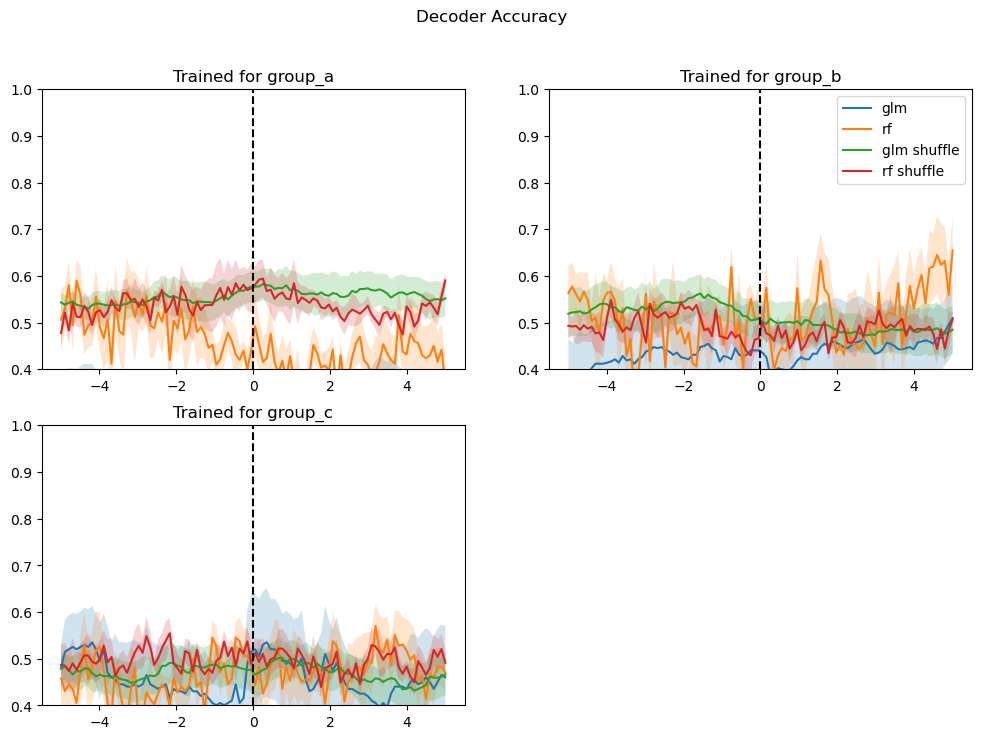

In [ ]:
novel_time = make_training_data(FCN, CNF, NFC, events = ['cagemate', 'novel', 'recall'], 
                            test_event = 'novel', equalize = 5, pre_window = 5, post_window = 0, no_PCs= 8, num_fold = 5, num_shuffle= 5)

training set: 117 58 2.0172413793103448
testing set: 54 22 2.4545454545454546
training set: 101 44 2.2954545454545454
testing set: 70 36 1.9444444444444444
training set: 124 58 2.1379310344827585
testing set: 47 22 2.1363636363636362


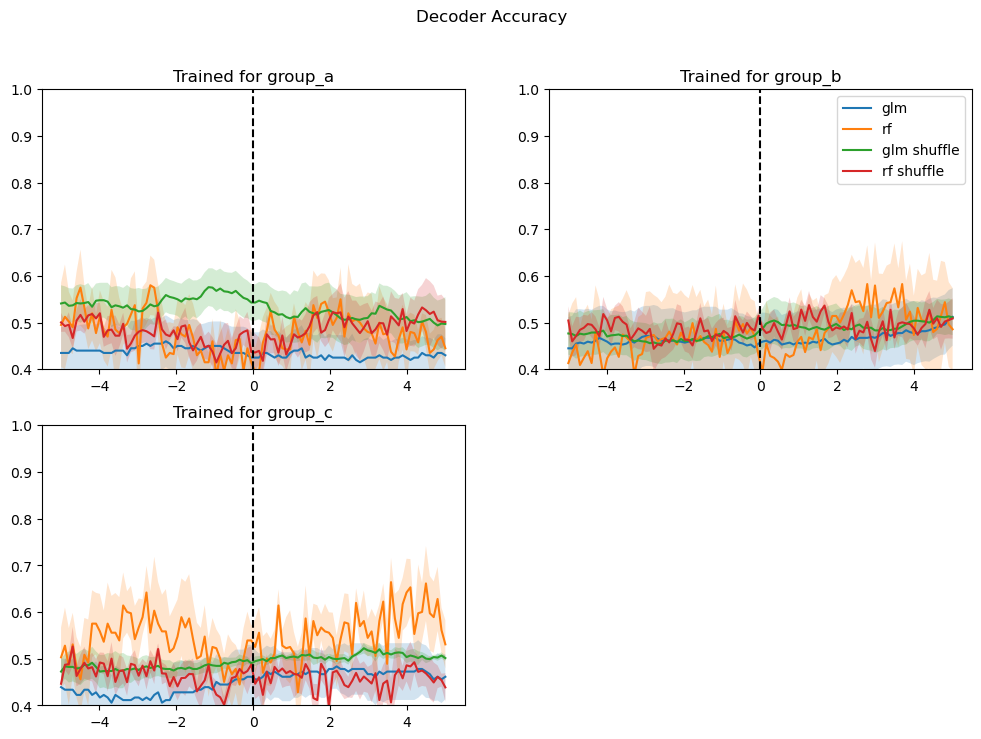

In [ ]:
recall_time = make_training_data(FCN, CNF, NFC, events = ['cagemate', 'novel', 'recall'], 
                            test_event = 'recall', equalize = 5, pre_window = 5, post_window = 0, no_PCs= 8, num_fold = 5, num_shuffle= 5)